## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "language_pt"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "language"
target_positive_class = "pt"


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 200


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6544
Epoch 11 Validation Loss: 0.6780
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6200
Epoch 21 Validation Loss: 0.6692
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5905
Epoch 31 Validation Loss: 0.6645
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5650
Epoch 41 Validation Loss: 0.6622
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5427
Epoch 51 Validation Loss: 0.6612
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5228
Epoch 61 Validation Loss: 0.6607
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5165
Epoch 71 Validation Loss: 0.6607
Model saved to train

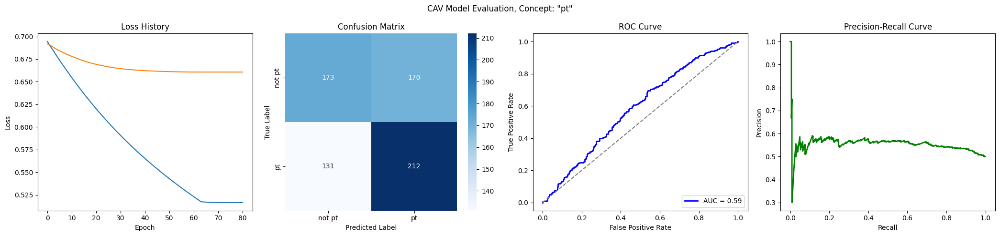

Training run 2/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6931
Epoch 1 Validation Loss: 0.6883
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6528
Epoch 11 Validation Loss: 0.6795
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6183
Epoch 21 Validation Loss: 0.6740
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5889
Epoch 31 Validation Loss: 0.6712
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5634
Epoch 41 Validation Loss: 0.6706
Early stopping at epoch 44
Loss history saved to trainings/language_pt/loss_history.json


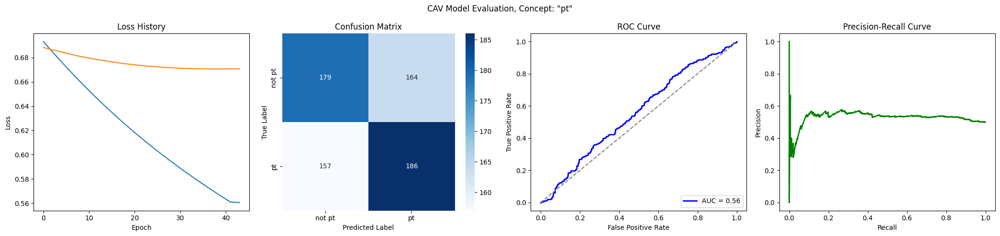

Training run 3/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6885
Epoch 1 Validation Loss: 0.6889
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6488
Epoch 11 Validation Loss: 0.6798
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6155
Epoch 21 Validation Loss: 0.6736
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5869
Epoch 31 Validation Loss: 0.6683
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5619
Epoch 41 Validation Loss: 0.6638
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5399
Epoch 51 Validation Loss: 0.6604
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5201
Epoch 61 Validation Loss: 0.6580
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5022
Epoch 71 Validation Loss: 0.6562
Model saved to train

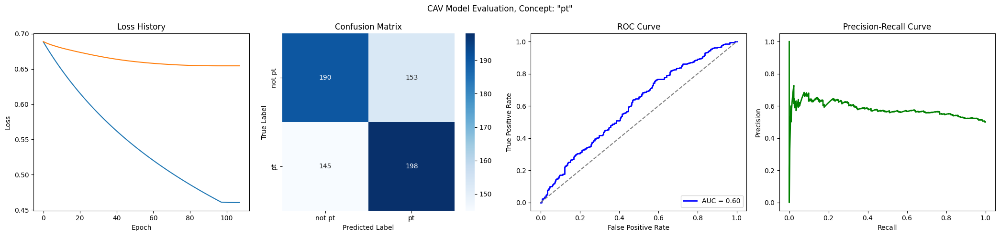

Training run 4/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6666
Epoch 11 Validation Loss: 0.6752
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6389
Epoch 21 Validation Loss: 0.6592
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6141
Epoch 31 Validation Loss: 0.6465
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5919
Epoch 41 Validation Loss: 0.6362
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5718
Epoch 51 Validation Loss: 0.6282
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5534
Epoch 61 Validation Loss: 0.6216
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5364
Epoch 71 Validation Loss: 0.6161
Model saved to train

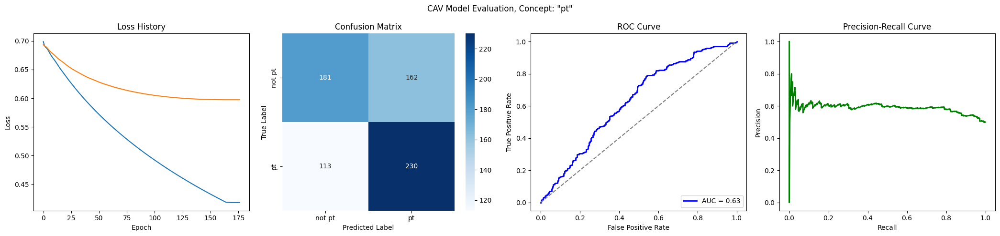

Training run 5/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6591
Epoch 11 Validation Loss: 0.6797
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6261
Epoch 21 Validation Loss: 0.6701
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5983
Epoch 31 Validation Loss: 0.6633
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5747
Epoch 41 Validation Loss: 0.6586
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5540
Epoch 51 Validation Loss: 0.6551
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5354
Epoch 61 Validation Loss: 0.6524
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5185
Epoch 71 Validation Loss: 0.6504
Model saved to train

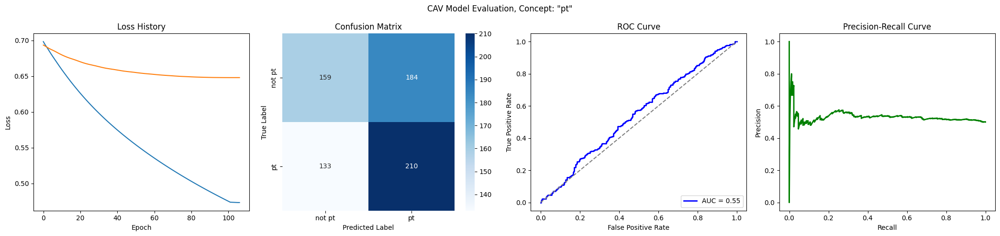

Training run 6/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6931
Epoch 1 Validation Loss: 0.6950
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6563
Epoch 11 Validation Loss: 0.6804
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6249
Epoch 21 Validation Loss: 0.6693
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5979
Epoch 31 Validation Loss: 0.6609
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5746
Epoch 41 Validation Loss: 0.6541
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5542
Epoch 51 Validation Loss: 0.6482
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5359
Epoch 61 Validation Loss: 0.6430
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5193
Epoch 71 Validation Loss: 0.6385
Model saved to train

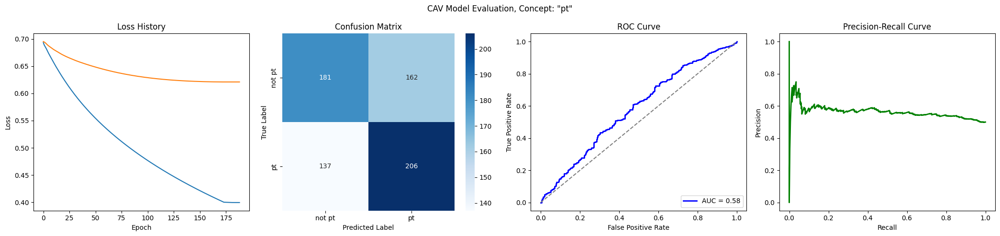

Training run 7/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6982
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6606
Epoch 11 Validation Loss: 0.6760
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6285
Epoch 21 Validation Loss: 0.6655
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6006
Epoch 31 Validation Loss: 0.6579
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5761
Epoch 41 Validation Loss: 0.6522
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5543
Epoch 51 Validation Loss: 0.6479
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5347
Epoch 61 Validation Loss: 0.6448
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5169
Epoch 71 Validation Loss: 0.6424
Model saved to train

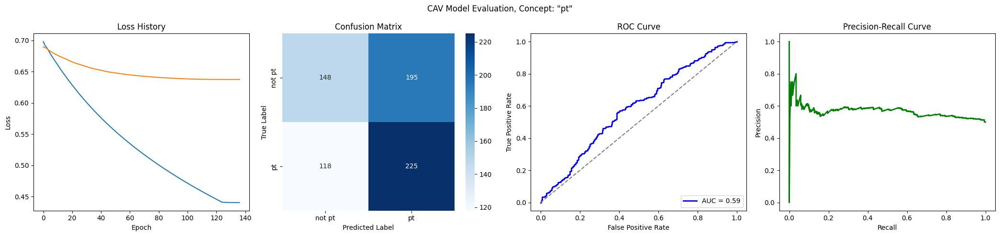

Training run 8/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6483
Epoch 11 Validation Loss: 0.6796
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6107
Epoch 21 Validation Loss: 0.6727
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5788
Epoch 31 Validation Loss: 0.6675
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5513
Epoch 41 Validation Loss: 0.6640
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5273
Epoch 51 Validation Loss: 0.6624
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5060
Epoch 61 Validation Loss: 0.6620
Early stopping at epoch 64
Loss history saved to trainings/language_pt/loss_history.json


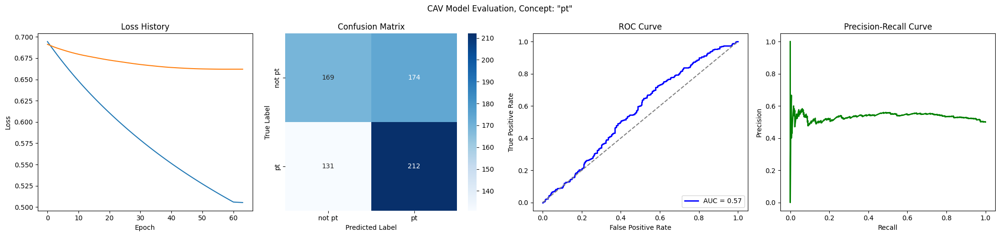

Training run 9/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6502
Epoch 11 Validation Loss: 0.6880
Early stopping at epoch 13
Loss history saved to trainings/language_pt/loss_history.json


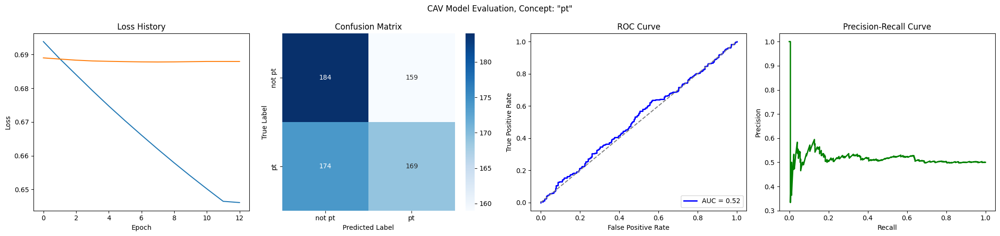

Training run 10/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6562
Epoch 11 Validation Loss: 0.6791
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6225
Epoch 21 Validation Loss: 0.6737
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5936
Epoch 31 Validation Loss: 0.6701
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5684
Epoch 41 Validation Loss: 0.6681
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5463
Epoch 51 Validation Loss: 0.6671
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5317
Epoch 61 Validation Loss: 0.6668
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5306
Epoch 71 Validation Loss: 0.6668
Model saved to trai

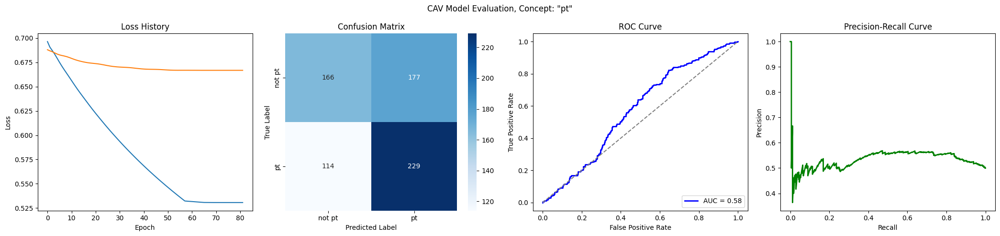

Training run 11/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6908
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6528
Epoch 11 Validation Loss: 0.6816
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6188
Epoch 21 Validation Loss: 0.6756
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5903
Epoch 31 Validation Loss: 0.6717
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5660
Epoch 41 Validation Loss: 0.6688
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5448
Epoch 51 Validation Loss: 0.6664
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5260
Epoch 61 Validation Loss: 0.6642
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5090
Epoch 71 Validation Loss: 0.6622
Model saved to trai

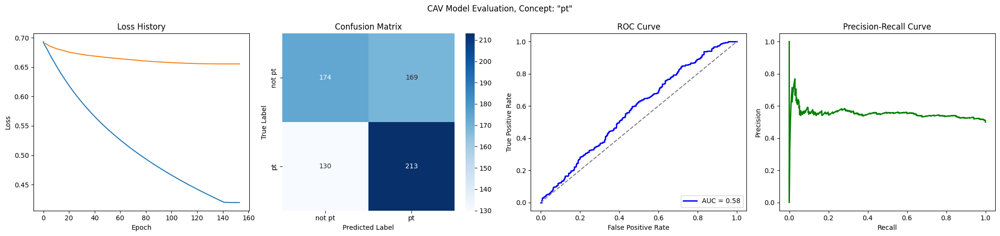

Training run 12/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6594
Epoch 11 Validation Loss: 0.6787
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6305
Epoch 21 Validation Loss: 0.6684
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6050
Epoch 31 Validation Loss: 0.6594
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5822
Epoch 41 Validation Loss: 0.6523
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5616
Epoch 51 Validation Loss: 0.6473
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5429
Epoch 61 Validation Loss: 0.6439
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5256
Epoch 71 Validation Loss: 0.6415
Model saved to trai

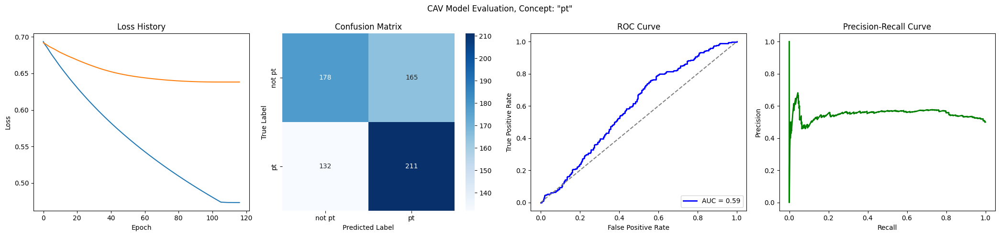

Training run 13/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6593
Epoch 11 Validation Loss: 0.6841
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6275
Epoch 21 Validation Loss: 0.6779
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6000
Epoch 31 Validation Loss: 0.6726
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5761
Epoch 41 Validation Loss: 0.6679
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5551
Epoch 51 Validation Loss: 0.6638
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5363
Epoch 61 Validation Loss: 0.6601
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5194
Epoch 71 Validation Loss: 0.6567
Model saved to trai

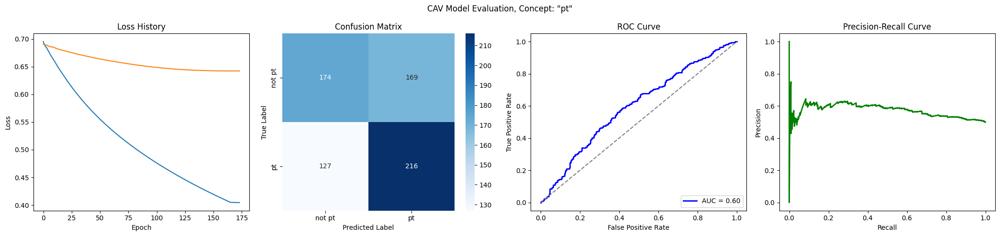

Training run 14/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6967
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6618
Epoch 11 Validation Loss: 0.6806
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6307
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6038
Epoch 31 Validation Loss: 0.6614
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5802
Epoch 41 Validation Loss: 0.6569
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5592
Epoch 51 Validation Loss: 0.6540
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5403
Epoch 61 Validation Loss: 0.6522
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5231
Epoch 71 Validation Loss: 0.6511
Model saved to trai

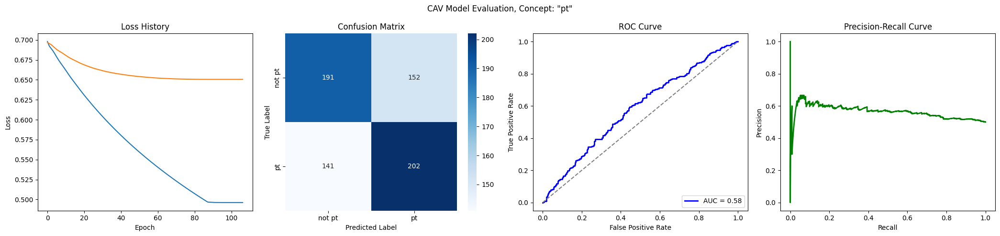

Training run 15/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6508
Epoch 11 Validation Loss: 0.6828
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6146
Epoch 21 Validation Loss: 0.6766
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5840
Epoch 31 Validation Loss: 0.6734
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5578
Epoch 41 Validation Loss: 0.6717
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5349
Epoch 51 Validation Loss: 0.6708
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5146
Epoch 61 Validation Loss: 0.6704
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 70
Loss history saved to trainings/language_pt/loss_history.json


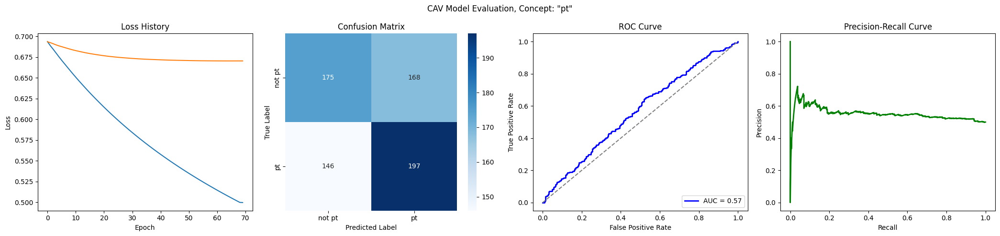

Training run 16/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6562
Epoch 11 Validation Loss: 0.6769
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6242
Epoch 21 Validation Loss: 0.6676
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5966
Epoch 31 Validation Loss: 0.6605
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5728
Epoch 41 Validation Loss: 0.6551
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5518
Epoch 51 Validation Loss: 0.6511
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5330
Epoch 61 Validation Loss: 0.6480
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5160
Epoch 71 Validation Loss: 0.6459
Model saved to trai

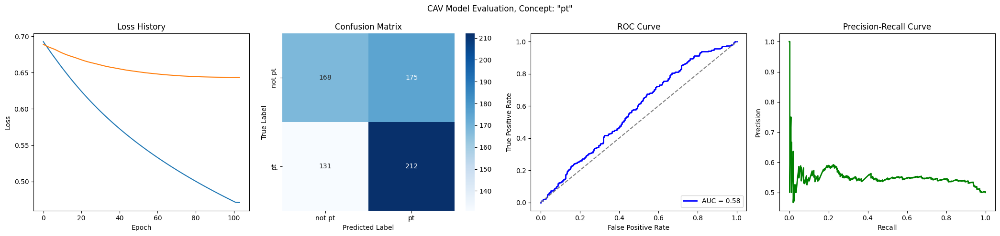

Training run 17/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6590
Epoch 11 Validation Loss: 0.6755
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6280
Epoch 21 Validation Loss: 0.6632
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6009
Epoch 31 Validation Loss: 0.6538
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5767
Epoch 41 Validation Loss: 0.6464
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5551
Epoch 51 Validation Loss: 0.6405
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5354
Epoch 61 Validation Loss: 0.6360
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5174
Epoch 71 Validation Loss: 0.6326
Model saved to trai

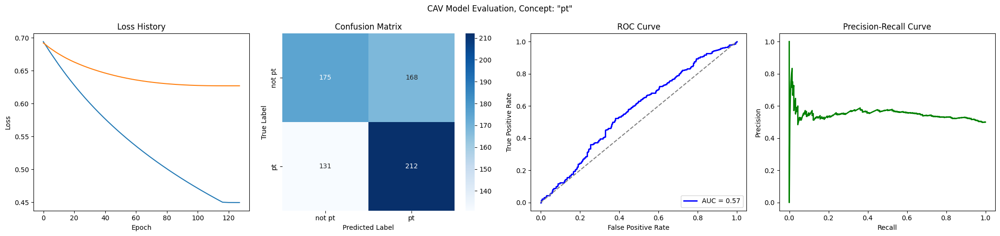

Training run 18/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6557
Epoch 11 Validation Loss: 0.6723
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6220
Epoch 21 Validation Loss: 0.6592
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5928
Epoch 31 Validation Loss: 0.6502
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5673
Epoch 41 Validation Loss: 0.6440
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5447
Epoch 51 Validation Loss: 0.6397
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5245
Epoch 61 Validation Loss: 0.6367
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5062
Epoch 71 Validation Loss: 0.6348
Model saved to trai

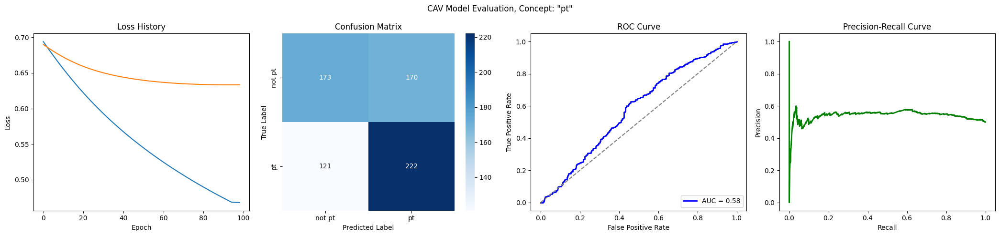

Training run 19/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6995
Epoch 1 Validation Loss: 0.6940
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6611
Epoch 11 Validation Loss: 0.6835
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6289
Epoch 21 Validation Loss: 0.6745
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5999
Epoch 31 Validation Loss: 0.6681
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5741
Epoch 41 Validation Loss: 0.6636
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5509
Epoch 51 Validation Loss: 0.6606
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5298
Epoch 61 Validation Loss: 0.6589
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5106
Epoch 71 Validation Loss: 0.6582
Model saved to trai

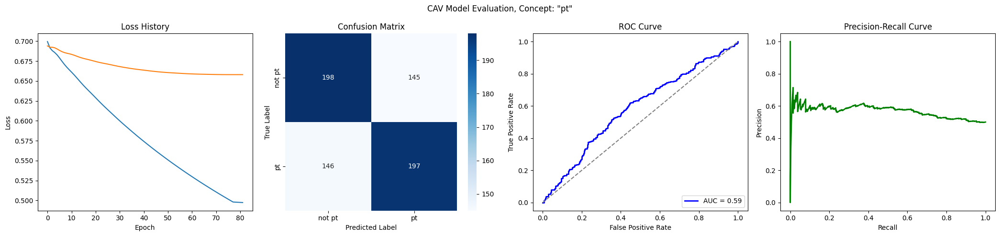

Training run 20/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6993
Epoch 1 Validation Loss: 0.6957
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6562
Epoch 11 Validation Loss: 0.6828
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6213
Epoch 21 Validation Loss: 0.6731
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5918
Epoch 31 Validation Loss: 0.6651
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5666
Epoch 41 Validation Loss: 0.6590
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5446
Epoch 51 Validation Loss: 0.6543
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5251
Epoch 61 Validation Loss: 0.6506
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5076
Epoch 71 Validation Loss: 0.6474
Model saved to trai

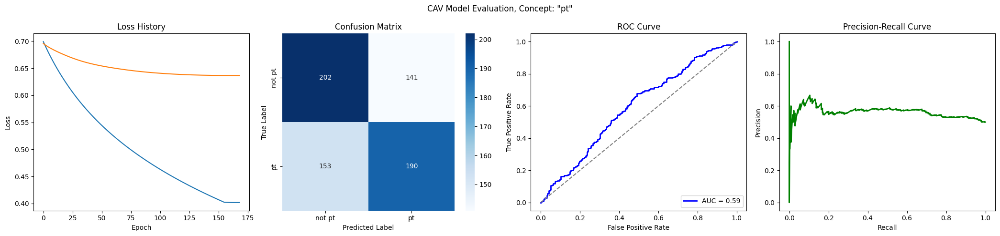

Training run 21/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6557
Epoch 11 Validation Loss: 0.6827
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6234
Epoch 21 Validation Loss: 0.6754
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5952
Epoch 31 Validation Loss: 0.6704
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5704
Epoch 41 Validation Loss: 0.6671
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5483
Epoch 51 Validation Loss: 0.6650
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5283
Epoch 61 Validation Loss: 0.6640
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 70
Loss history saved to trainings/language_pt/loss_history.json


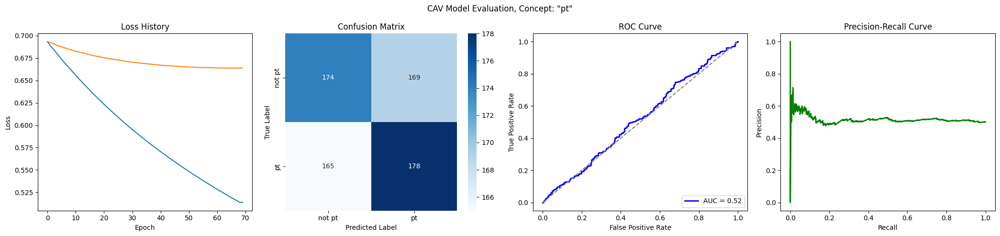

Training run 22/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6594
Epoch 11 Validation Loss: 0.6818
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6265
Epoch 21 Validation Loss: 0.6733
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5975
Epoch 31 Validation Loss: 0.6677
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5721
Epoch 41 Validation Loss: 0.6640
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5496
Epoch 51 Validation Loss: 0.6617
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5294
Epoch 61 Validation Loss: 0.6602
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5111
Epoch 71 Validation Loss: 0.6592
Model saved to trai

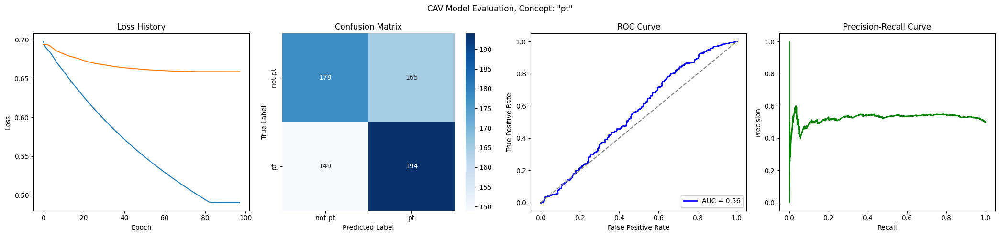

Training run 23/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6522
Epoch 11 Validation Loss: 0.6765
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6190
Epoch 21 Validation Loss: 0.6656
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5905
Epoch 31 Validation Loss: 0.6572
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5655
Epoch 41 Validation Loss: 0.6515
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5434
Epoch 51 Validation Loss: 0.6478
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5235
Epoch 61 Validation Loss: 0.6456
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5056
Epoch 71 Validation Loss: 0.6442
Model saved to trai

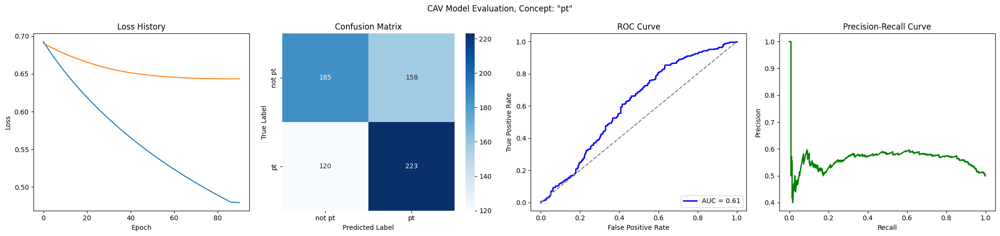

Training run 24/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6985
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6585
Epoch 11 Validation Loss: 0.6808
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6240
Epoch 21 Validation Loss: 0.6722
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5947
Epoch 31 Validation Loss: 0.6662
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5692
Epoch 41 Validation Loss: 0.6619
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5467
Epoch 51 Validation Loss: 0.6587
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5265
Epoch 61 Validation Loss: 0.6563
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5082
Epoch 71 Validation Loss: 0.6546
Model saved to trai

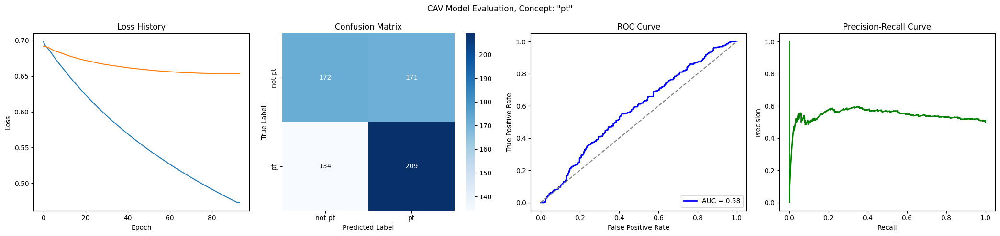

Training run 25/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6509
Epoch 11 Validation Loss: 0.6843
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6129
Epoch 21 Validation Loss: 0.6791
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5804
Epoch 31 Validation Loss: 0.6769
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5525
Epoch 41 Validation Loss: 0.6766
Early stopping at epoch 45
Loss history saved to trainings/language_pt/loss_history.json


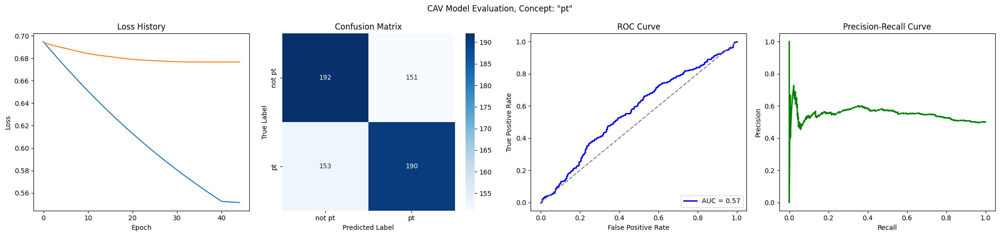

Training run 26/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6600
Epoch 11 Validation Loss: 0.6833
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6275
Epoch 21 Validation Loss: 0.6767
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5994
Epoch 31 Validation Loss: 0.6718
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5748
Epoch 41 Validation Loss: 0.6678
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5529
Epoch 51 Validation Loss: 0.6643
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5332
Epoch 61 Validation Loss: 0.6613
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5154
Epoch 71 Validation Loss: 0.6591
Model saved to trai

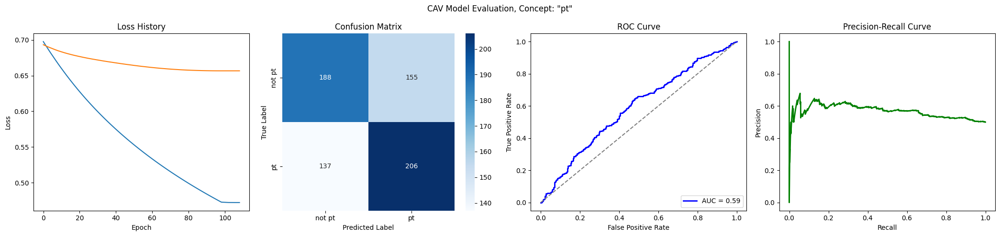

Training run 27/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7016
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6612
Epoch 11 Validation Loss: 0.6808
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6292
Epoch 21 Validation Loss: 0.6728
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6005
Epoch 31 Validation Loss: 0.6658
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5750
Epoch 41 Validation Loss: 0.6606
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5523
Epoch 51 Validation Loss: 0.6568
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5317
Epoch 61 Validation Loss: 0.6541
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5130
Epoch 71 Validation Loss: 0.6524
Model saved to trai

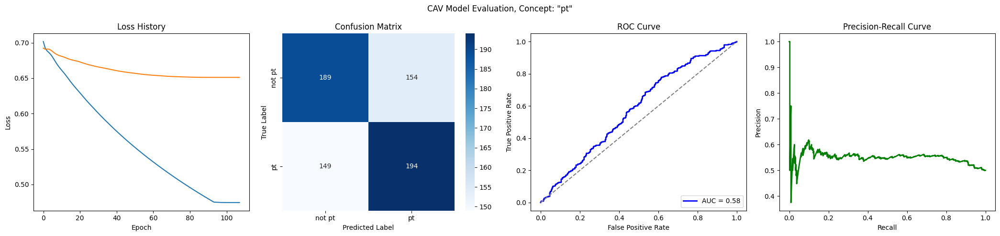

Training run 28/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6624
Epoch 11 Validation Loss: 0.6799
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6350
Epoch 21 Validation Loss: 0.6680
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6111
Epoch 31 Validation Loss: 0.6579
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5896
Epoch 41 Validation Loss: 0.6498
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5702
Epoch 51 Validation Loss: 0.6441
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5525
Epoch 61 Validation Loss: 0.6405
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6199
Epoch 21 Validation Loss: 0.6726
Model saved to trai

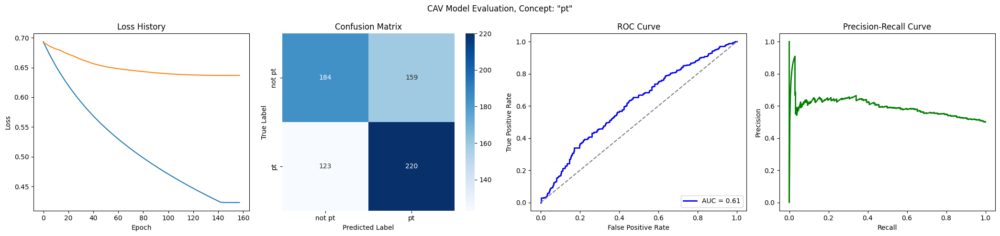

Training run 32/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6893
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6496
Epoch 11 Validation Loss: 0.6776
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6172
Epoch 21 Validation Loss: 0.6691
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5893
Epoch 31 Validation Loss: 0.6624
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5649
Epoch 41 Validation Loss: 0.6581
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5431
Epoch 51 Validation Loss: 0.6561
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5235
Epoch 61 Validation Loss: 0.6555
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5135
Epoch 71 Validation Loss: 0.6554
Model saved to trai

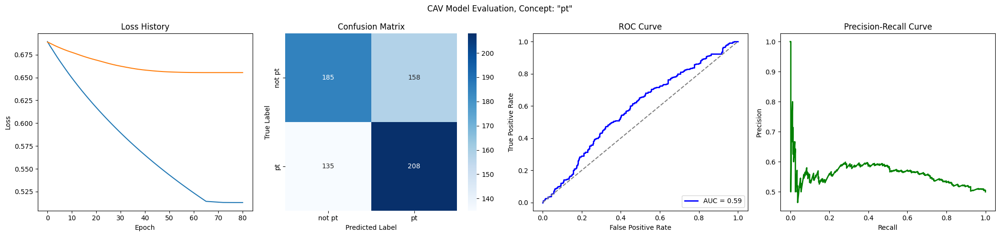

Training run 33/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6974
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6611
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6293
Epoch 21 Validation Loss: 0.6708
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6014
Epoch 31 Validation Loss: 0.6641
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5769
Epoch 41 Validation Loss: 0.6596
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5552
Epoch 51 Validation Loss: 0.6568
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5358
Epoch 61 Validation Loss: 0.6554
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5182
Epoch 71 Validation Loss: 0.6549
Model saved to trai

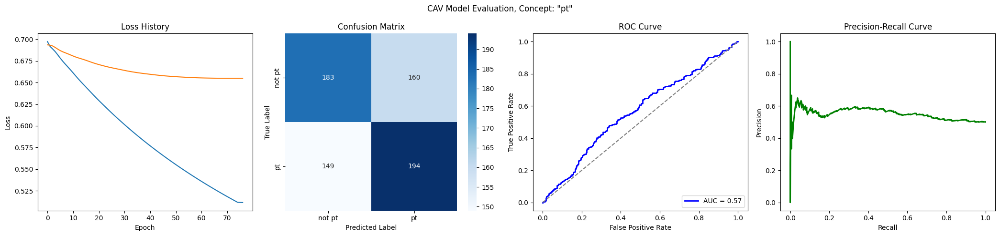

Training run 34/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6573
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6232
Epoch 21 Validation Loss: 0.6787
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5934
Epoch 31 Validation Loss: 0.6752
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5672
Epoch 41 Validation Loss: 0.6729
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5438
Epoch 51 Validation Loss: 0.6715
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5228
Epoch 61 Validation Loss: 0.6711
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 67
Loss history saved to trainings/language_pt/loss_history.json


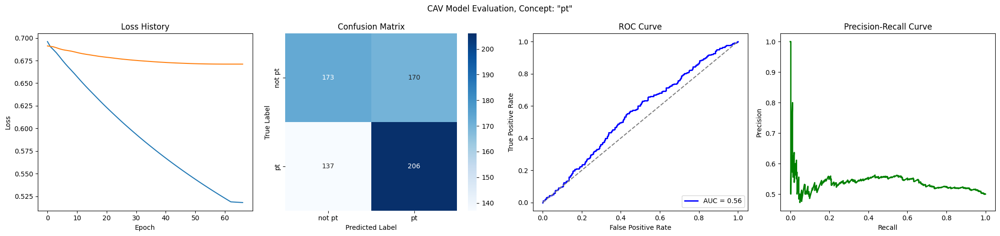

Training run 35/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6573
Epoch 11 Validation Loss: 0.6792
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6250
Epoch 21 Validation Loss: 0.6694
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5966
Epoch 31 Validation Loss: 0.6630
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5714
Epoch 41 Validation Loss: 0.6584
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5489
Epoch 51 Validation Loss: 0.6553
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5285
Epoch 61 Validation Loss: 0.6532
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5099
Epoch 71 Validation Loss: 0.6519
Model saved to trai

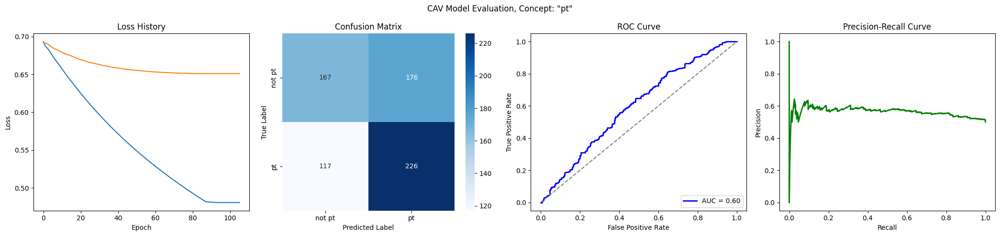

Training run 36/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6533
Epoch 11 Validation Loss: 0.6752
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6179
Epoch 21 Validation Loss: 0.6659
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5872
Epoch 31 Validation Loss: 0.6601
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5605
Epoch 41 Validation Loss: 0.6567
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5370
Epoch 51 Validation Loss: 0.6548
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5161
Epoch 61 Validation Loss: 0.6539
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5021
Epoch 71 Validation Loss: 0.6538
Early stopping at e

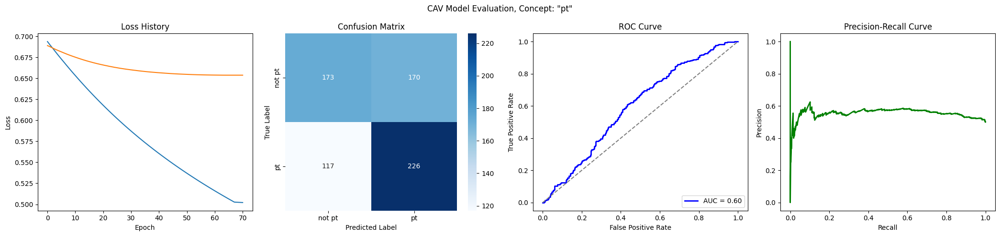

Training run 37/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6526
Epoch 11 Validation Loss: 0.6840
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6170
Epoch 21 Validation Loss: 0.6787
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5863
Epoch 31 Validation Loss: 0.6762
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5597
Epoch 41 Validation Loss: 0.6757
Early stopping at epoch 45
Loss history saved to trainings/language_pt/loss_history.json


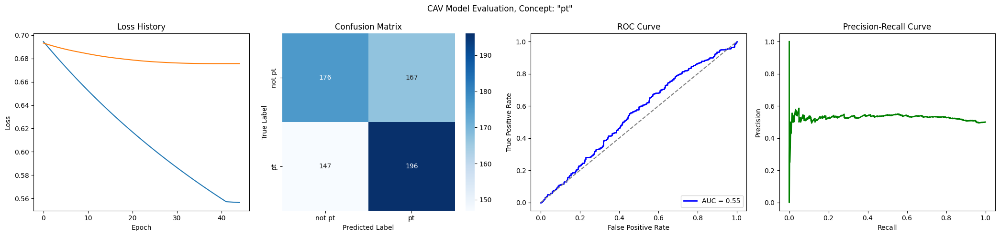

Training run 38/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6887
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6603
Epoch 11 Validation Loss: 0.6753
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6291
Epoch 21 Validation Loss: 0.6651
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6013
Epoch 31 Validation Loss: 0.6576
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5764
Epoch 41 Validation Loss: 0.6524
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5541
Epoch 51 Validation Loss: 0.6490
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5338
Epoch 61 Validation Loss: 0.6472
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5153
Epoch 71 Validation Loss: 0.6465
Model saved to trai

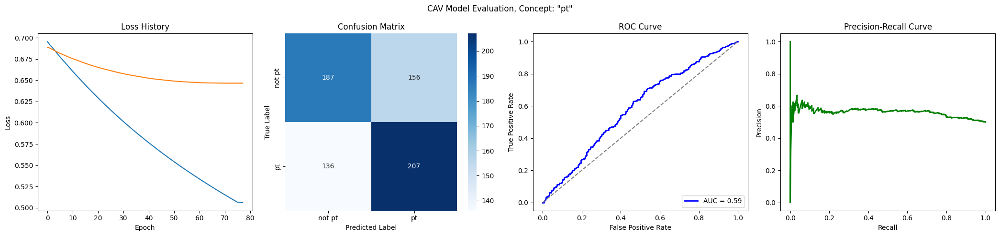

Training run 39/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6981
Epoch 1 Validation Loss: 0.6975
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6608
Epoch 11 Validation Loss: 0.6855
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6290
Epoch 21 Validation Loss: 0.6758
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6017
Epoch 31 Validation Loss: 0.6680
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5781
Epoch 41 Validation Loss: 0.6620
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5571
Epoch 51 Validation Loss: 0.6575
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5382
Epoch 61 Validation Loss: 0.6542
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5210
Epoch 71 Validation Loss: 0.6519
Model saved to trai

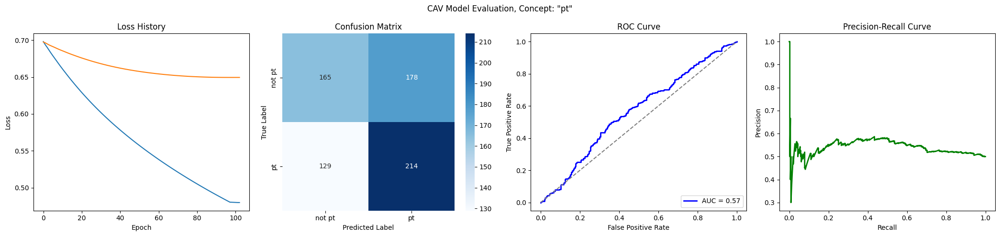

Training run 40/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6962
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6573
Epoch 11 Validation Loss: 0.6885
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6281
Epoch 21 Validation Loss: 0.6868
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6038
Epoch 31 Validation Loss: 0.6832
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5824
Epoch 41 Validation Loss: 0.6775
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5632
Epoch 51 Validation Loss: 0.6722
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5456
Epoch 61 Validation Loss: 0.6684
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5294
Epoch 71 Validation Loss: 0.6659
Model saved to trai

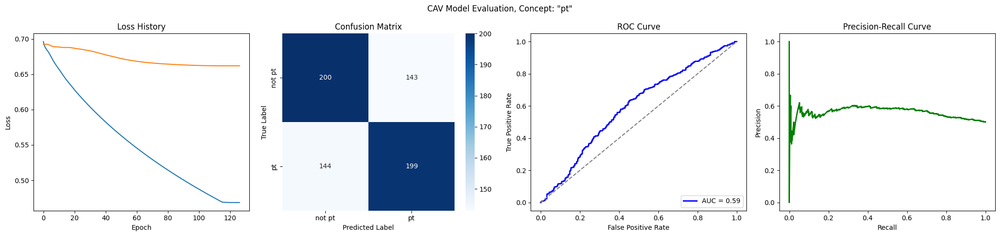

Training run 41/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6990
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6584
Epoch 11 Validation Loss: 0.6827
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6226
Epoch 21 Validation Loss: 0.6781
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5917
Epoch 31 Validation Loss: 0.6761
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5650
Epoch 41 Validation Loss: 0.6755
Early stopping at epoch 42
Loss history saved to trainings/language_pt/loss_history.json


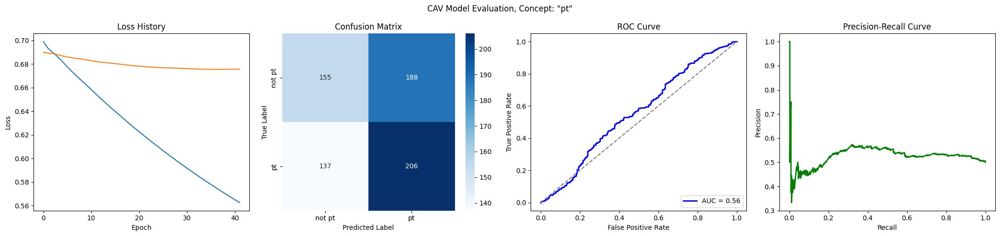

Training run 42/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6997
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6605
Epoch 11 Validation Loss: 0.6807
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6280
Epoch 21 Validation Loss: 0.6709
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5983
Epoch 31 Validation Loss: 0.6642
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5718
Epoch 41 Validation Loss: 0.6595
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5481
Epoch 51 Validation Loss: 0.6559
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5268
Epoch 61 Validation Loss: 0.6537
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5074
Epoch 71 Validation Loss: 0.6522
Model saved to trai

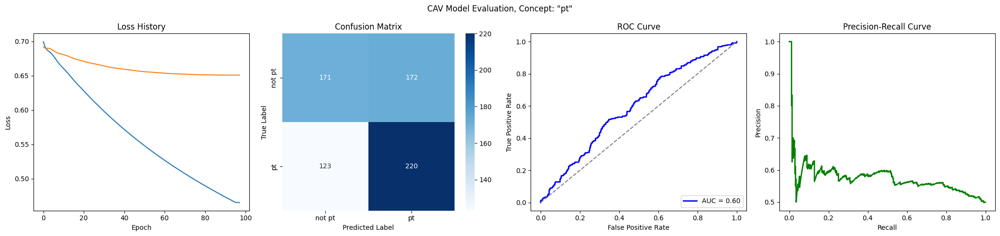

Training run 43/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6536
Epoch 11 Validation Loss: 0.6727
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6194
Epoch 21 Validation Loss: 0.6607
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5903
Epoch 31 Validation Loss: 0.6521
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5652
Epoch 41 Validation Loss: 0.6459
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5429
Epoch 51 Validation Loss: 0.6412
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5230
Epoch 61 Validation Loss: 0.6376
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5048
Epoch 71 Validation Loss: 0.6349
Model saved to trai

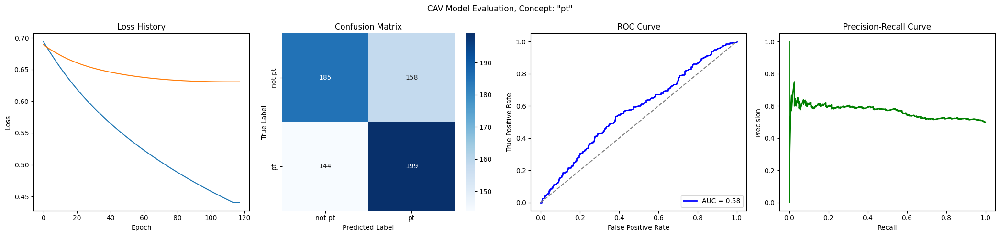

Training run 44/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6604
Epoch 11 Validation Loss: 0.6810
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6296
Epoch 21 Validation Loss: 0.6712
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6022
Epoch 31 Validation Loss: 0.6637
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5777
Epoch 41 Validation Loss: 0.6580
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5557
Epoch 51 Validation Loss: 0.6538
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5358
Epoch 61 Validation Loss: 0.6507
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5178
Epoch 71 Validation Loss: 0.6487
Model saved to trai

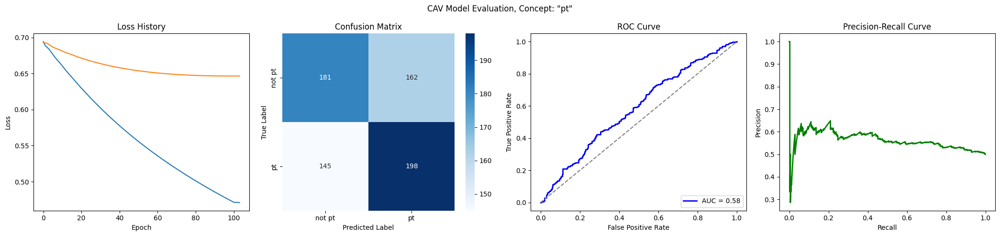

Training run 45/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6566
Epoch 11 Validation Loss: 0.6794
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6229
Epoch 21 Validation Loss: 0.6666
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5931
Epoch 31 Validation Loss: 0.6558
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5666
Epoch 41 Validation Loss: 0.6476
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5431
Epoch 51 Validation Loss: 0.6419
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5218
Epoch 61 Validation Loss: 0.6381
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5024
Epoch 71 Validation Loss: 0.6355
Model saved to trai

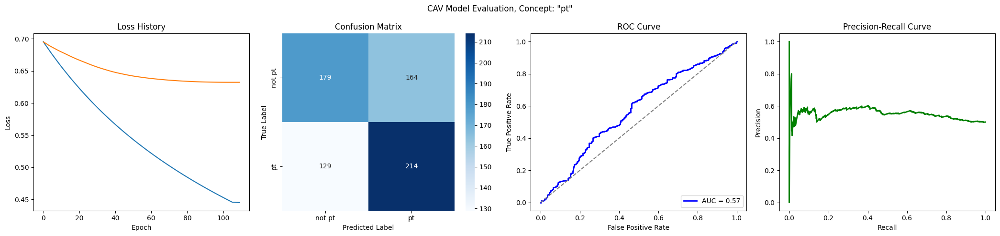

Training run 46/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6977
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6595
Epoch 11 Validation Loss: 0.6790
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6260
Epoch 21 Validation Loss: 0.6690
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5966
Epoch 31 Validation Loss: 0.6625
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5706
Epoch 41 Validation Loss: 0.6583
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5473
Epoch 51 Validation Loss: 0.6557
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5264
Epoch 61 Validation Loss: 0.6542
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5072
Epoch 71 Validation Loss: 0.6536
Model saved to trai

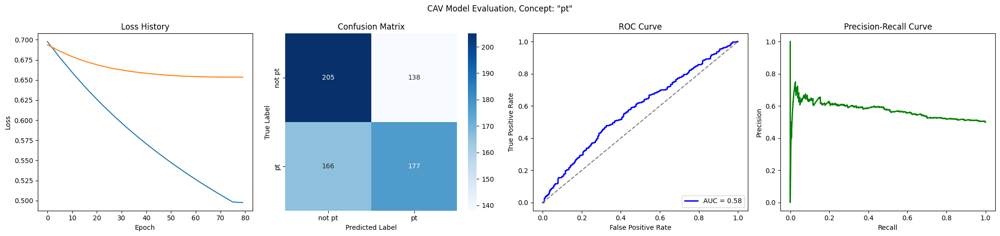

Training run 47/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6898
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6572
Epoch 11 Validation Loss: 0.6736
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6256
Epoch 21 Validation Loss: 0.6594
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5978
Epoch 31 Validation Loss: 0.6485
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5731
Epoch 41 Validation Loss: 0.6403
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5508
Epoch 51 Validation Loss: 0.6340
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5305
Epoch 61 Validation Loss: 0.6289
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5119
Epoch 71 Validation Loss: 0.6250
Model saved to trai

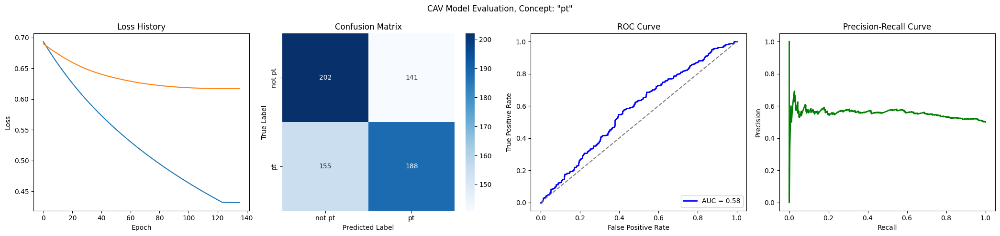

Training run 48/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6952
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6599
Epoch 11 Validation Loss: 0.6754
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6294
Epoch 21 Validation Loss: 0.6611
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6028
Epoch 31 Validation Loss: 0.6500
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5794
Epoch 41 Validation Loss: 0.6413
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5585
Epoch 51 Validation Loss: 0.6342
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5395
Epoch 61 Validation Loss: 0.6284
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5222
Epoch 71 Validation Loss: 0.6237
Model saved to trai

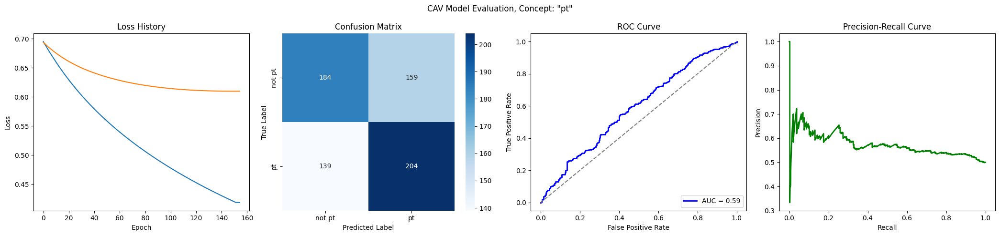

Training run 49/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6548
Epoch 11 Validation Loss: 0.6797
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6209
Epoch 21 Validation Loss: 0.6710
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5913
Epoch 31 Validation Loss: 0.6645
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5652
Epoch 41 Validation Loss: 0.6595
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5421
Epoch 51 Validation Loss: 0.6558
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5212
Epoch 61 Validation Loss: 0.6529
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5023
Epoch 71 Validation Loss: 0.6508
Model saved to trai

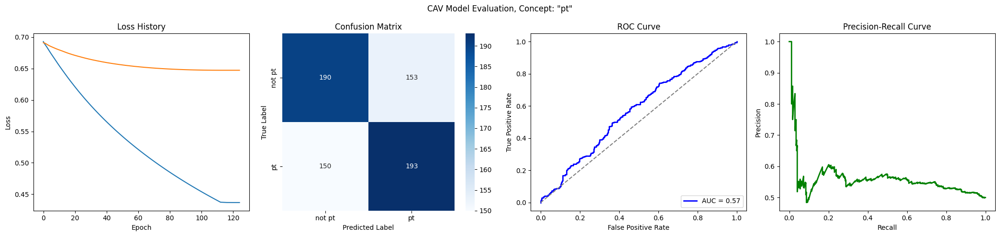

Training run 50/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7014
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6661
Epoch 11 Validation Loss: 0.6821
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6379
Epoch 21 Validation Loss: 0.6712
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6143
Epoch 31 Validation Loss: 0.6618
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5944
Epoch 41 Validation Loss: 0.6532
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5769
Epoch 51 Validation Loss: 0.6454
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5611
Epoch 61 Validation Loss: 0.6383
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5467
Epoch 71 Validation Loss: 0.6319
Model saved to trai

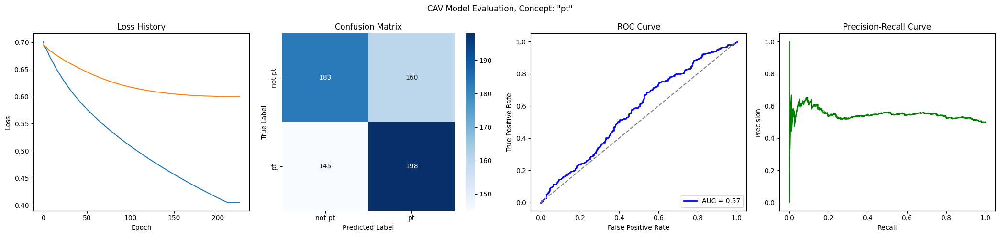

Training run 51/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7006
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6656
Epoch 11 Validation Loss: 0.6815
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6357
Epoch 21 Validation Loss: 0.6711
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6090
Epoch 31 Validation Loss: 0.6649
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5854
Epoch 41 Validation Loss: 0.6613
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5643
Epoch 51 Validation Loss: 0.6591
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5454
Epoch 61 Validation Loss: 0.6580
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5283
Epoch 71 Validation Loss: 0.6578
Model saved to trai

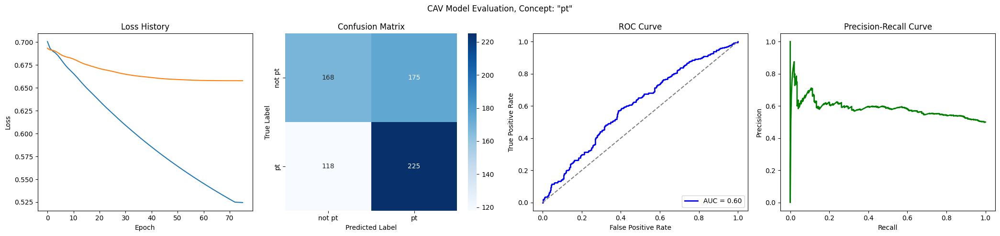

Training run 52/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6947
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6598
Epoch 11 Validation Loss: 0.6812
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6293
Epoch 21 Validation Loss: 0.6713
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6027
Epoch 31 Validation Loss: 0.6643
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5791
Epoch 41 Validation Loss: 0.6594
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5579
Epoch 51 Validation Loss: 0.6558
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5387
Epoch 61 Validation Loss: 0.6534
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5212
Epoch 71 Validation Loss: 0.6518
Model saved to trai

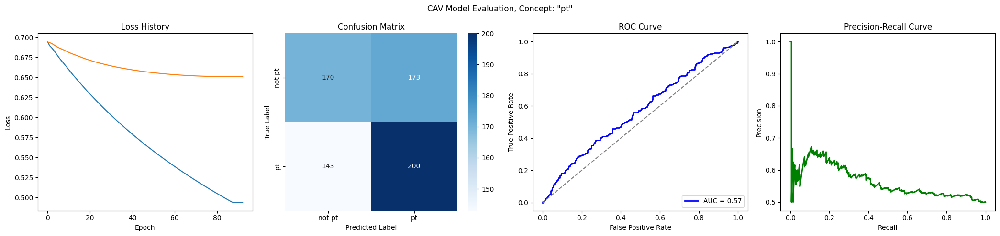

Training run 53/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6923
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6499
Epoch 11 Validation Loss: 0.6779
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6148
Epoch 21 Validation Loss: 0.6683
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5851
Epoch 31 Validation Loss: 0.6619
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5596
Epoch 41 Validation Loss: 0.6576
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5374
Epoch 51 Validation Loss: 0.6546
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5177
Epoch 61 Validation Loss: 0.6526
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5000
Epoch 71 Validation Loss: 0.6515
Model saved to trai

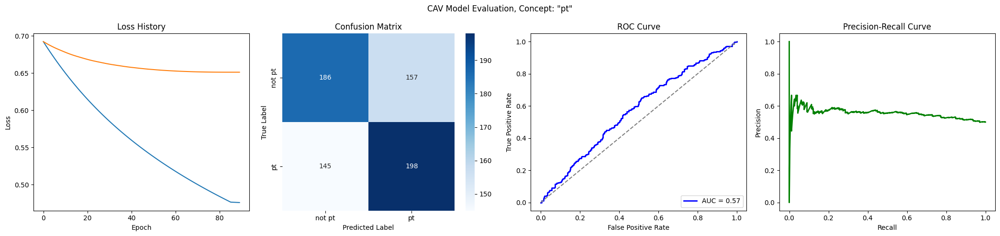

Training run 54/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6943
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6577
Epoch 11 Validation Loss: 0.6837
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6253
Epoch 21 Validation Loss: 0.6764
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5969
Epoch 31 Validation Loss: 0.6717
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5720
Epoch 41 Validation Loss: 0.6689
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5497
Epoch 51 Validation Loss: 0.6676
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5297
Epoch 61 Validation Loss: 0.6671
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 68
Loss history saved to trainings/language_pt/loss_history.json


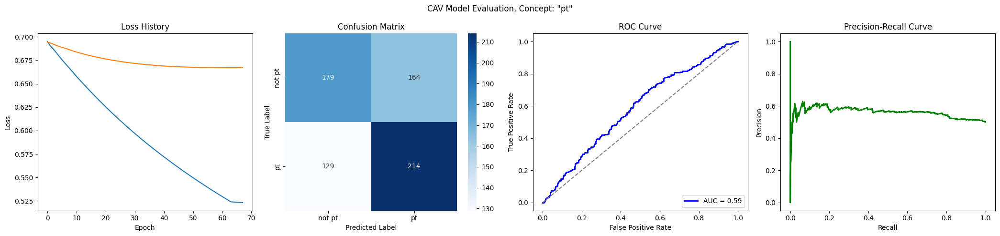

Training run 55/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6556
Epoch 11 Validation Loss: 0.6732
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6232
Epoch 21 Validation Loss: 0.6591
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5952
Epoch 31 Validation Loss: 0.6490
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5708
Epoch 41 Validation Loss: 0.6419
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5492
Epoch 51 Validation Loss: 0.6368
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5301
Epoch 61 Validation Loss: 0.6332
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5128
Epoch 71 Validation Loss: 0.6307
Model saved to trai

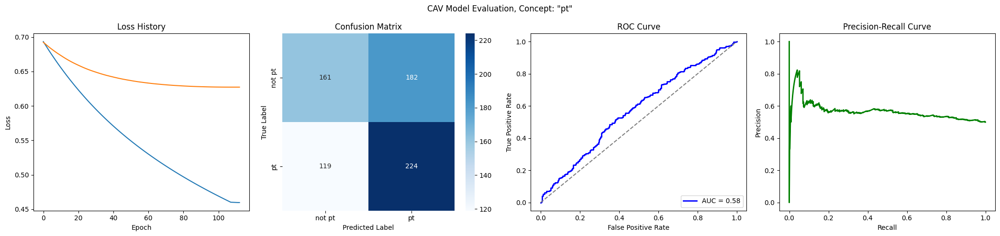

Training run 56/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6541
Epoch 11 Validation Loss: 0.6806
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6182
Epoch 21 Validation Loss: 0.6749
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5876
Epoch 31 Validation Loss: 0.6727
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5613
Epoch 41 Validation Loss: 0.6722
Early stopping at epoch 44
Loss history saved to trainings/language_pt/loss_history.json


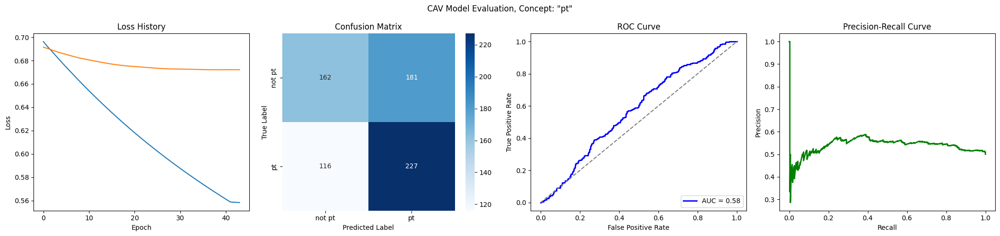

Training run 57/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6530
Epoch 11 Validation Loss: 0.6735
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6195
Epoch 21 Validation Loss: 0.6604
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5908
Epoch 31 Validation Loss: 0.6505
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5659
Epoch 41 Validation Loss: 0.6434
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5440
Epoch 51 Validation Loss: 0.6386
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5244
Epoch 61 Validation Loss: 0.6353
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5068
Epoch 71 Validation Loss: 0.6332
Model saved to trai

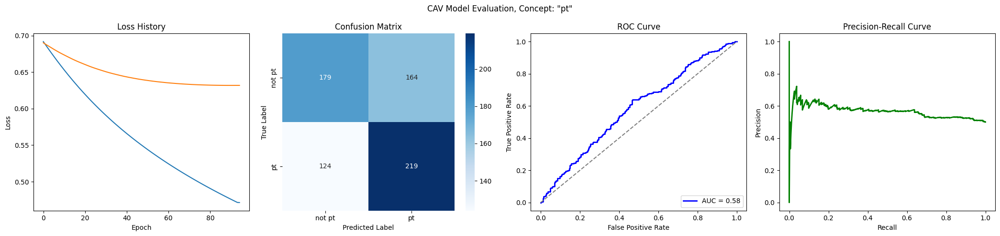

Training run 58/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6969
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6525
Epoch 11 Validation Loss: 0.6884
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6179
Epoch 21 Validation Loss: 0.6815
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5887
Epoch 31 Validation Loss: 0.6746
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5636
Epoch 41 Validation Loss: 0.6687
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5418
Epoch 51 Validation Loss: 0.6645
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5225
Epoch 61 Validation Loss: 0.6620
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5050
Epoch 71 Validation Loss: 0.6605
Model saved to trai

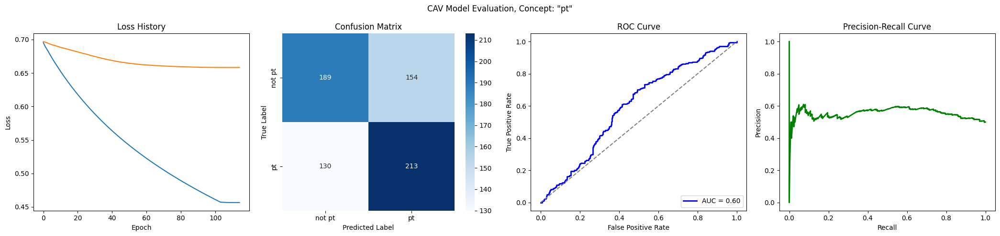

Training run 59/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6508
Epoch 11 Validation Loss: 0.6786
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6152
Epoch 21 Validation Loss: 0.6706
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5854
Epoch 31 Validation Loss: 0.6643
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5598
Epoch 41 Validation Loss: 0.6598
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5373
Epoch 51 Validation Loss: 0.6572
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5174
Epoch 61 Validation Loss: 0.6558
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4994
Epoch 71 Validation Loss: 0.6554
Model saved to trai

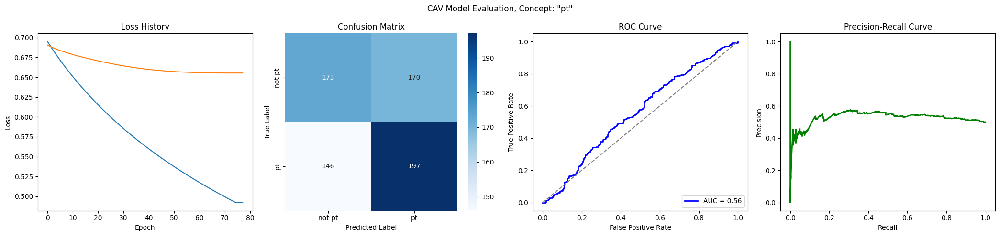

Training run 60/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6557
Epoch 11 Validation Loss: 0.6787
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6223
Epoch 21 Validation Loss: 0.6690
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5927
Epoch 31 Validation Loss: 0.6626
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5664
Epoch 41 Validation Loss: 0.6588
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5430
Epoch 51 Validation Loss: 0.6571
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5220
Epoch 61 Validation Loss: 0.6567
Early stopping at epoch 65
Loss history saved to trainings/language_pt/loss_history.json


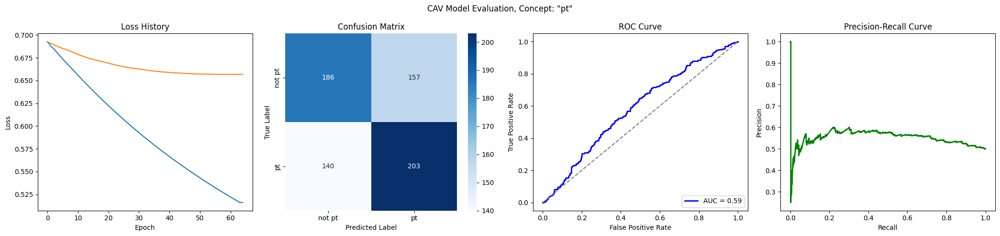

Training run 61/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6575
Epoch 11 Validation Loss: 0.6809
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6261
Epoch 21 Validation Loss: 0.6742
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5989
Epoch 31 Validation Loss: 0.6703
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5748
Epoch 41 Validation Loss: 0.6673
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5533
Epoch 51 Validation Loss: 0.6649
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5337
Epoch 61 Validation Loss: 0.6633
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5158
Epoch 71 Validation Loss: 0.6625
Model saved to trai

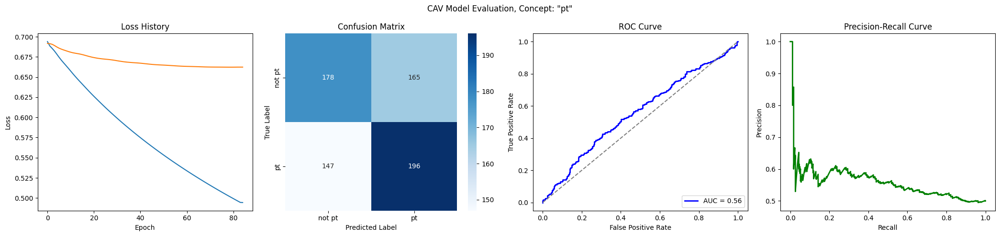

Training run 62/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6996
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6606
Epoch 11 Validation Loss: 0.6857
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6274
Epoch 21 Validation Loss: 0.6807
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5983
Epoch 31 Validation Loss: 0.6790
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5773
Epoch 41 Validation Loss: 0.6789
Early stopping at epoch 41
Loss history saved to trainings/language_pt/loss_history.json


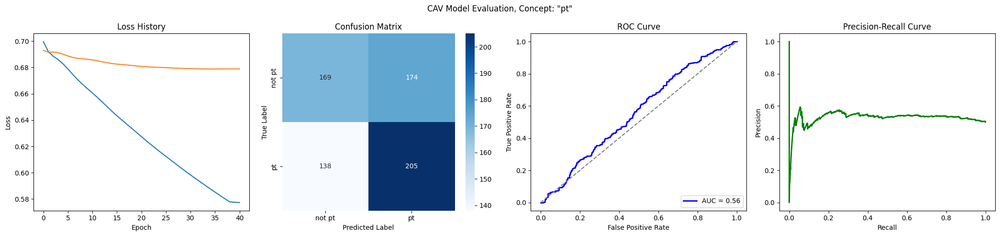

Training run 63/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6652
Epoch 11 Validation Loss: 0.6753
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6366
Epoch 21 Validation Loss: 0.6614
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6111
Epoch 31 Validation Loss: 0.6502
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5885
Epoch 41 Validation Loss: 0.6417
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5686
Epoch 51 Validation Loss: 0.6351
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5508
Epoch 61 Validation Loss: 0.6301
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5347
Epoch 71 Validation Loss: 0.6260
Model saved to trai

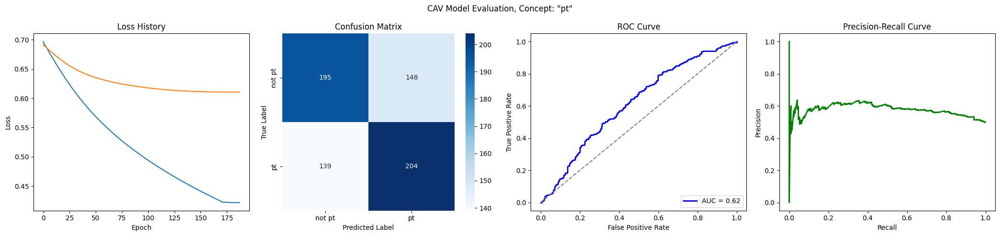

Training run 64/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6506
Epoch 11 Validation Loss: 0.6811
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6159
Epoch 21 Validation Loss: 0.6735
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5862
Epoch 31 Validation Loss: 0.6663
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5604
Epoch 41 Validation Loss: 0.6606
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5375
Epoch 51 Validation Loss: 0.6572
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5168
Epoch 61 Validation Loss: 0.6556
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4981
Epoch 71 Validation Loss: 0.6551
Model saved to trai

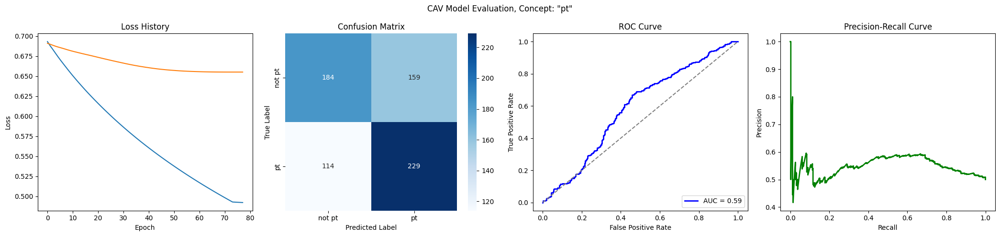

Training run 65/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6595
Epoch 11 Validation Loss: 0.6752
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6317
Epoch 21 Validation Loss: 0.6634
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6070
Epoch 31 Validation Loss: 0.6528
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5848
Epoch 41 Validation Loss: 0.6446
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5646
Epoch 51 Validation Loss: 0.6393
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5460
Epoch 61 Validation Loss: 0.6358
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5289
Epoch 71 Validation Loss: 0.6332
Model saved to trai

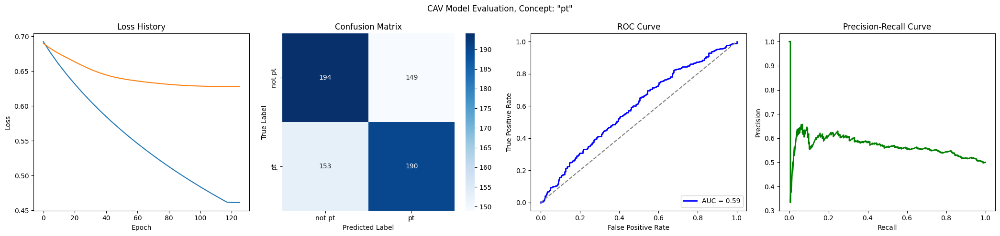

Training run 66/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6959
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6523
Epoch 11 Validation Loss: 0.6827
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6178
Epoch 21 Validation Loss: 0.6730
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5882
Epoch 31 Validation Loss: 0.6659
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5623
Epoch 41 Validation Loss: 0.6607
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5395
Epoch 51 Validation Loss: 0.6568
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5190
Epoch 61 Validation Loss: 0.6539
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5004
Epoch 71 Validation Loss: 0.6520
Model saved to trai

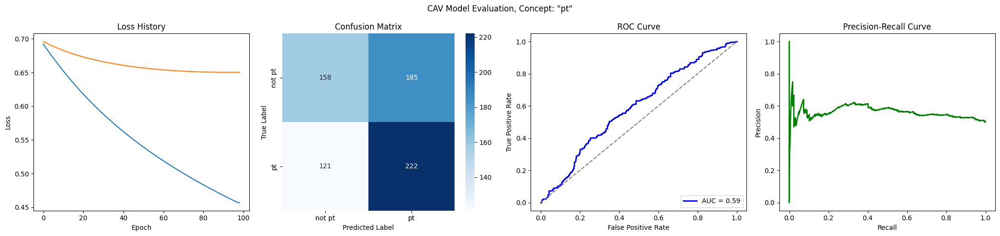

Training run 67/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6661
Epoch 11 Validation Loss: 0.6793
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6376
Epoch 21 Validation Loss: 0.6687
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6117
Epoch 31 Validation Loss: 0.6612
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5881
Epoch 41 Validation Loss: 0.6561
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5664
Epoch 51 Validation Loss: 0.6528
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5465
Epoch 61 Validation Loss: 0.6508
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5281
Epoch 71 Validation Loss: 0.6499
Model saved to trai

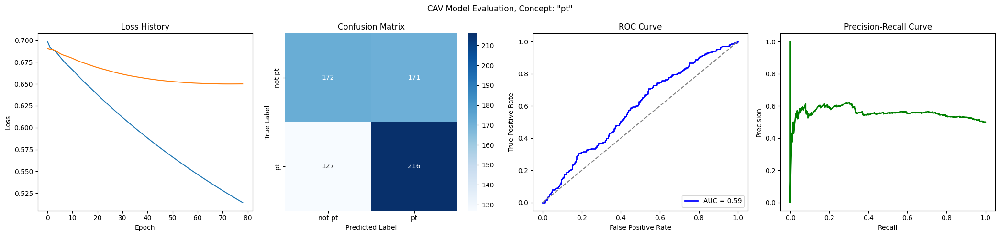

Training run 68/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6967
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6579
Epoch 11 Validation Loss: 0.6797
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6242
Epoch 21 Validation Loss: 0.6708
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5944
Epoch 31 Validation Loss: 0.6647
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5682
Epoch 41 Validation Loss: 0.6608
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5449
Epoch 51 Validation Loss: 0.6585
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5239
Epoch 61 Validation Loss: 0.6571
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5050
Epoch 71 Validation Loss: 0.6564
Model saved to trai

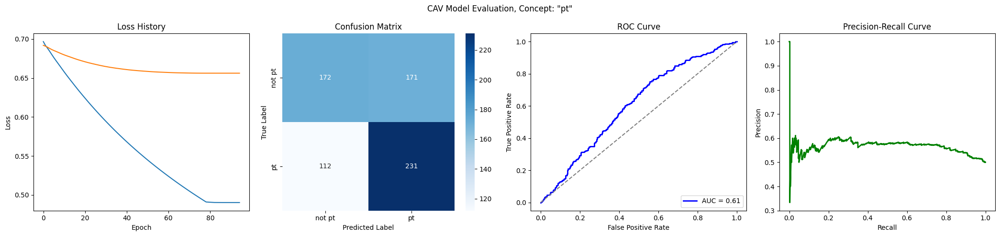

Training run 69/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6948
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6607
Epoch 11 Validation Loss: 0.6843
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6299
Epoch 21 Validation Loss: 0.6757
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6032
Epoch 31 Validation Loss: 0.6691
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5798
Epoch 41 Validation Loss: 0.6642
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5590
Epoch 51 Validation Loss: 0.6610
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5404
Epoch 61 Validation Loss: 0.6592
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5234
Epoch 71 Validation Loss: 0.6583
Model saved to trai

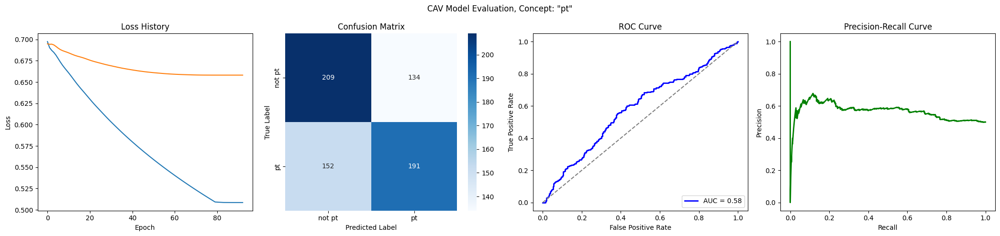

Training run 70/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6899
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6536
Epoch 11 Validation Loss: 0.6778
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6218
Epoch 21 Validation Loss: 0.6657
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5943
Epoch 31 Validation Loss: 0.6564
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5702
Epoch 41 Validation Loss: 0.6492
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5488
Epoch 51 Validation Loss: 0.6438
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5295
Epoch 61 Validation Loss: 0.6397
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5119
Epoch 71 Validation Loss: 0.6367
Model saved to trai

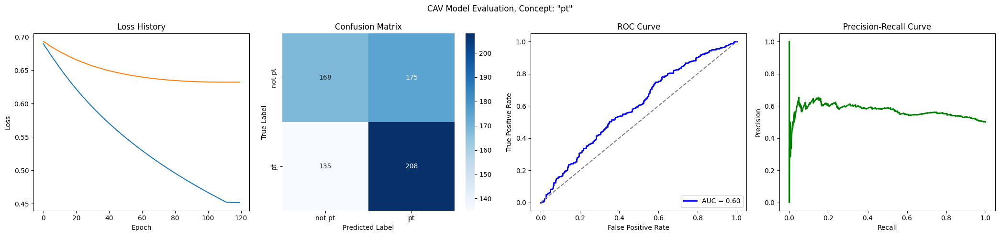

Training run 71/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7021
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6673
Epoch 11 Validation Loss: 0.6794
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6382
Epoch 21 Validation Loss: 0.6682
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6122
Epoch 31 Validation Loss: 0.6608
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5894
Epoch 41 Validation Loss: 0.6556
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5690
Epoch 51 Validation Loss: 0.6516
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5507
Epoch 61 Validation Loss: 0.6489
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5340
Epoch 71 Validation Loss: 0.6472
Model saved to trai

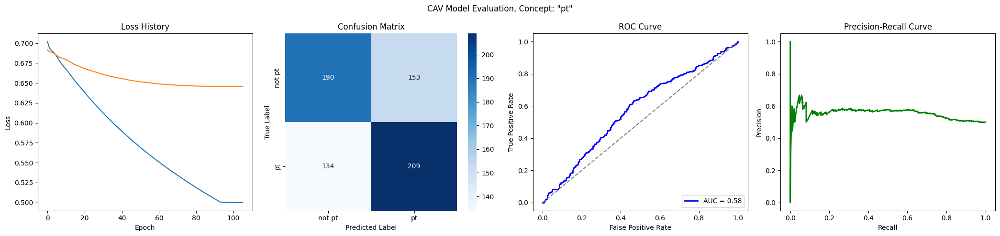

Training run 72/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7011
Epoch 1 Validation Loss: 0.6971
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6612
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6274
Epoch 21 Validation Loss: 0.6776
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5979
Epoch 31 Validation Loss: 0.6724
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5718
Epoch 41 Validation Loss: 0.6691
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5486
Epoch 51 Validation Loss: 0.6669
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5277
Epoch 61 Validation Loss: 0.6656
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5087
Epoch 71 Validation Loss: 0.6651
Model saved to trai

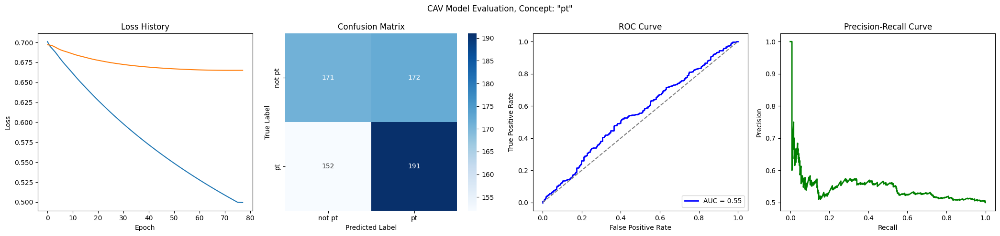

Training run 73/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6916
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6558
Epoch 11 Validation Loss: 0.6891
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 17
Loss history saved to trainings/language_pt/loss_history.json


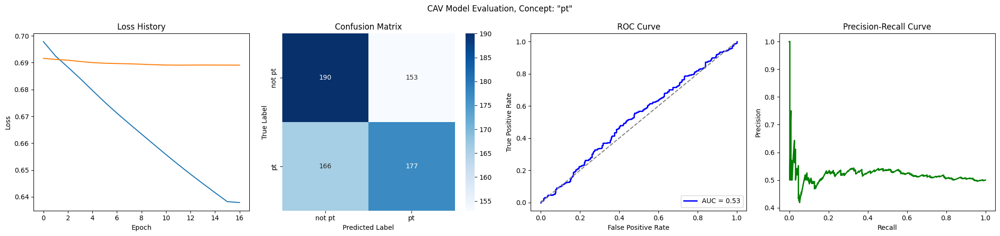

Training run 74/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6919
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6486
Epoch 11 Validation Loss: 0.6796
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6122
Epoch 21 Validation Loss: 0.6721
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5816
Epoch 31 Validation Loss: 0.6682
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5556
Epoch 41 Validation Loss: 0.6660
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5331
Epoch 51 Validation Loss: 0.6648
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5131
Epoch 61 Validation Loss: 0.6643
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 69
Loss history saved to trainings/language_pt/loss_history.json


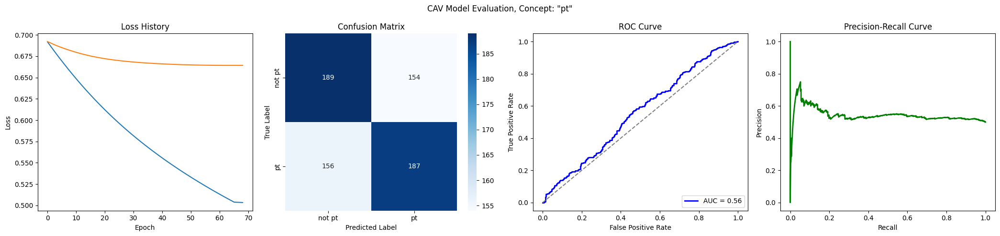

Training run 75/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7015
Epoch 1 Validation Loss: 0.6889
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6648
Epoch 11 Validation Loss: 0.6754
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6335
Epoch 21 Validation Loss: 0.6642
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6059
Epoch 31 Validation Loss: 0.6556
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5818
Epoch 41 Validation Loss: 0.6491
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5602
Epoch 51 Validation Loss: 0.6444
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5409
Epoch 61 Validation Loss: 0.6409
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5233
Epoch 71 Validation Loss: 0.6382
Model saved to trai

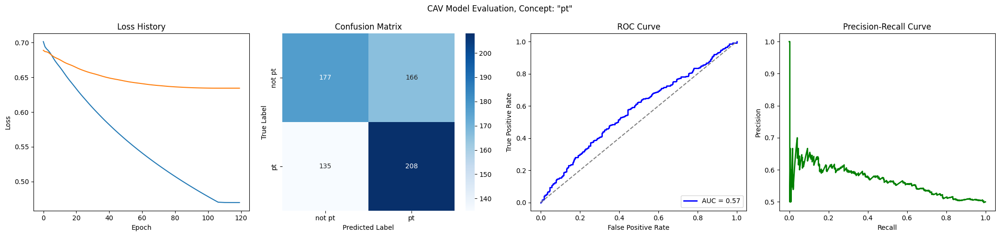

Training run 76/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7048
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6699
Epoch 11 Validation Loss: 0.6803
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6392
Epoch 21 Validation Loss: 0.6709
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6119
Epoch 31 Validation Loss: 0.6649
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5877
Epoch 41 Validation Loss: 0.6614
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5661
Epoch 51 Validation Loss: 0.6596
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5468
Epoch 61 Validation Loss: 0.6590
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 69
Loss history saved to trainings/language_pt/loss_history.json


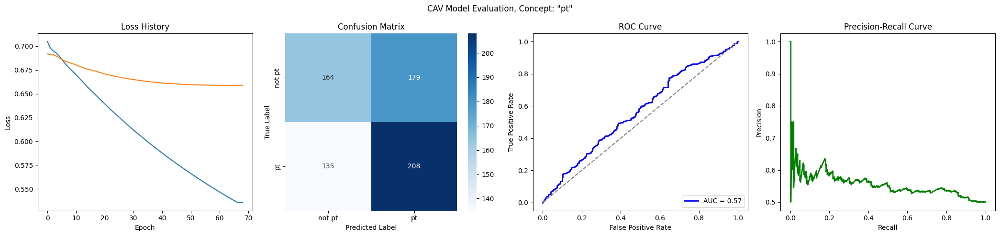

Training run 77/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6604
Epoch 11 Validation Loss: 0.6793
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6302
Epoch 21 Validation Loss: 0.6711
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6039
Epoch 31 Validation Loss: 0.6657
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5806
Epoch 41 Validation Loss: 0.6624
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5597
Epoch 51 Validation Loss: 0.6607
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5406
Epoch 61 Validation Loss: 0.6601
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 67
Loss history saved to trainings/language_pt/loss_history.json


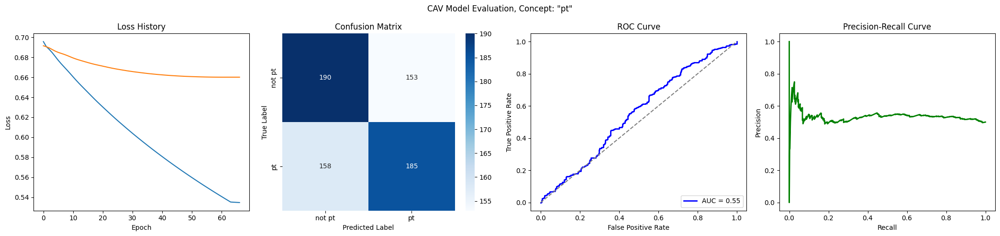

Training run 78/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6903
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6551
Epoch 11 Validation Loss: 0.6766
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6246
Epoch 21 Validation Loss: 0.6652
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5978
Epoch 31 Validation Loss: 0.6566
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5740
Epoch 41 Validation Loss: 0.6504
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5525
Epoch 51 Validation Loss: 0.6458
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5331
Epoch 61 Validation Loss: 0.6425
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5152
Epoch 71 Validation Loss: 0.6399
Model saved to trai

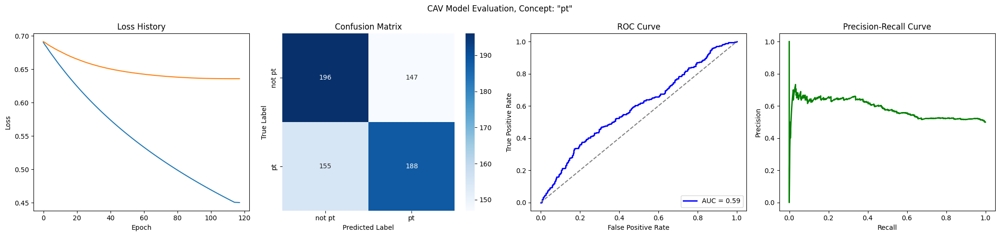

Training run 79/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6536
Epoch 11 Validation Loss: 0.6800
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6196
Epoch 21 Validation Loss: 0.6735
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5909
Epoch 31 Validation Loss: 0.6692
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5663
Epoch 41 Validation Loss: 0.6662
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5447
Epoch 51 Validation Loss: 0.6640
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5254
Epoch 61 Validation Loss: 0.6622
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5079
Epoch 71 Validation Loss: 0.6609
Model saved to trai

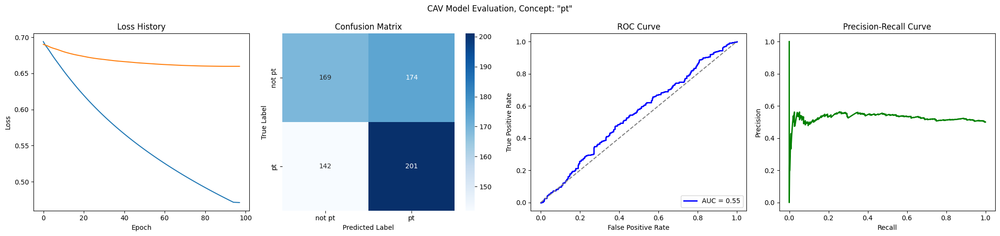

Training run 80/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6563
Epoch 11 Validation Loss: 0.6851
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6205
Epoch 21 Validation Loss: 0.6784
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5894
Epoch 31 Validation Loss: 0.6736
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5619
Epoch 41 Validation Loss: 0.6703
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5376
Epoch 51 Validation Loss: 0.6681
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5159
Epoch 61 Validation Loss: 0.6668
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4964
Epoch 71 Validation Loss: 0.6662
Model saved to trai

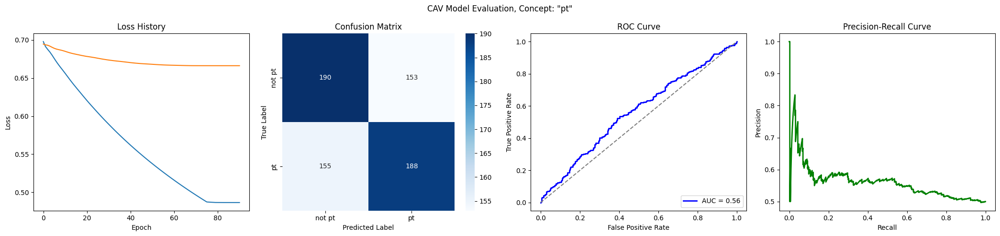

Training run 81/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6982
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6578
Epoch 11 Validation Loss: 0.6842
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6269
Epoch 21 Validation Loss: 0.6740
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5995
Epoch 31 Validation Loss: 0.6670
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5752
Epoch 41 Validation Loss: 0.6625
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5534
Epoch 51 Validation Loss: 0.6597
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5337
Epoch 61 Validation Loss: 0.6580
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5158
Epoch 71 Validation Loss: 0.6571
Model saved to trai

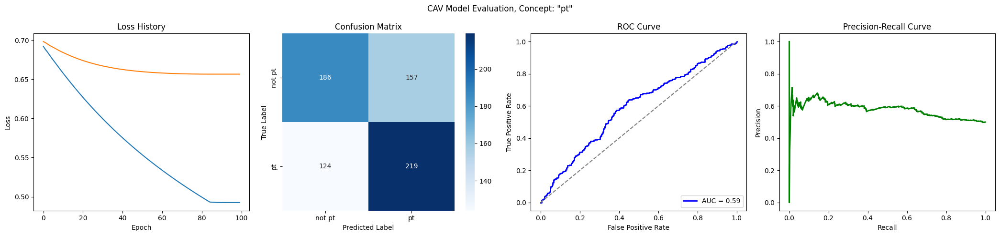

Training run 82/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7021
Epoch 1 Validation Loss: 0.6978
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6675
Epoch 11 Validation Loss: 0.6856
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6399
Epoch 21 Validation Loss: 0.6734
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6151
Epoch 31 Validation Loss: 0.6653
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5931
Epoch 41 Validation Loss: 0.6581
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5734
Epoch 51 Validation Loss: 0.6518
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5555
Epoch 61 Validation Loss: 0.6470
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5392
Epoch 71 Validation Loss: 0.6430
Model saved to trai

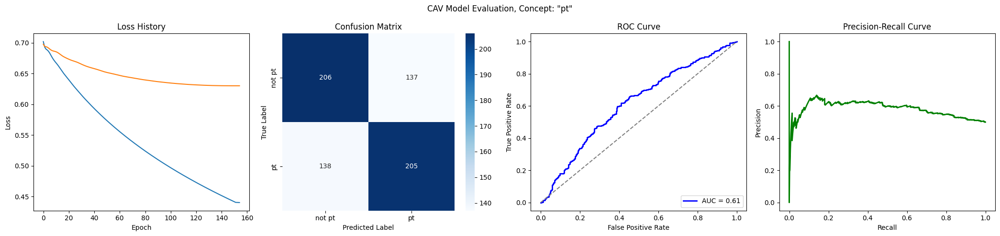

Training run 83/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6955
Epoch 1 Validation Loss: 0.6949
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6543
Epoch 11 Validation Loss: 0.6834
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6191
Epoch 21 Validation Loss: 0.6762
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5891
Epoch 31 Validation Loss: 0.6720
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5631
Epoch 41 Validation Loss: 0.6693
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5404
Epoch 51 Validation Loss: 0.6671
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5202
Epoch 61 Validation Loss: 0.6653
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5021
Epoch 71 Validation Loss: 0.6636
Model saved to trai

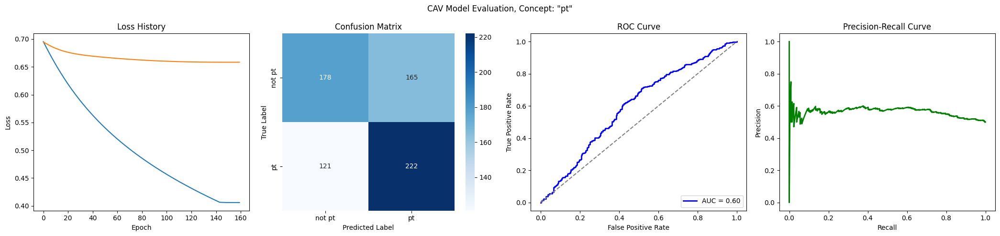

Training run 84/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6884
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6477
Epoch 11 Validation Loss: 0.6753
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6152
Epoch 21 Validation Loss: 0.6661
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5879
Epoch 31 Validation Loss: 0.6587
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5643
Epoch 41 Validation Loss: 0.6534
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5435
Epoch 51 Validation Loss: 0.6499
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5248
Epoch 61 Validation Loss: 0.6475
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5078
Epoch 71 Validation Loss: 0.6457
Model saved to trai

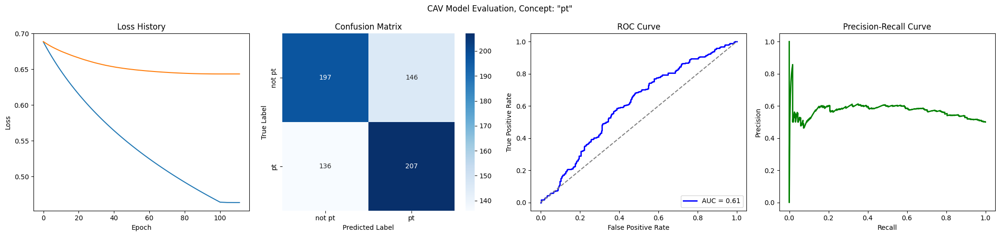

Training run 85/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6960
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/language_pt/loss_history.json


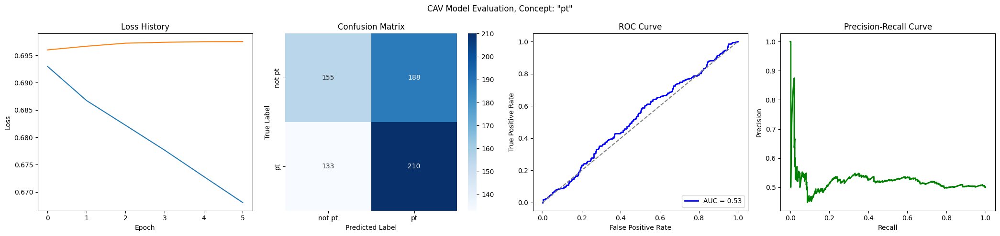

Training run 86/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6508
Epoch 11 Validation Loss: 0.6799
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6151
Epoch 21 Validation Loss: 0.6735
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5844
Epoch 31 Validation Loss: 0.6680
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5577
Epoch 41 Validation Loss: 0.6637
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5344
Epoch 51 Validation Loss: 0.6610
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5138
Epoch 61 Validation Loss: 0.6596
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4953
Epoch 71 Validation Loss: 0.6588
Model saved to trai

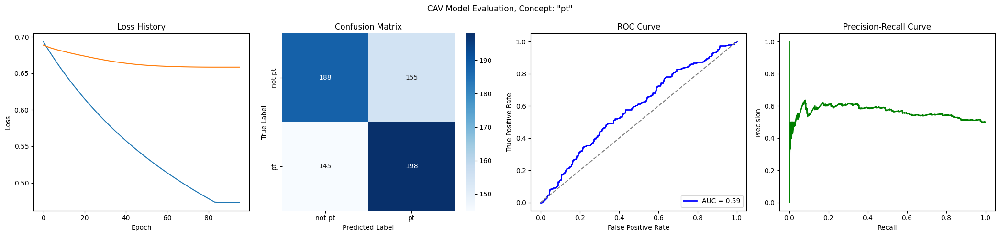

Training run 87/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6568
Epoch 11 Validation Loss: 0.6721
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6253
Epoch 21 Validation Loss: 0.6601
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5985
Epoch 31 Validation Loss: 0.6502
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5750
Epoch 41 Validation Loss: 0.6423
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5539
Epoch 51 Validation Loss: 0.6362
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5347
Epoch 61 Validation Loss: 0.6316
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5170
Epoch 71 Validation Loss: 0.6281
Model saved to trai

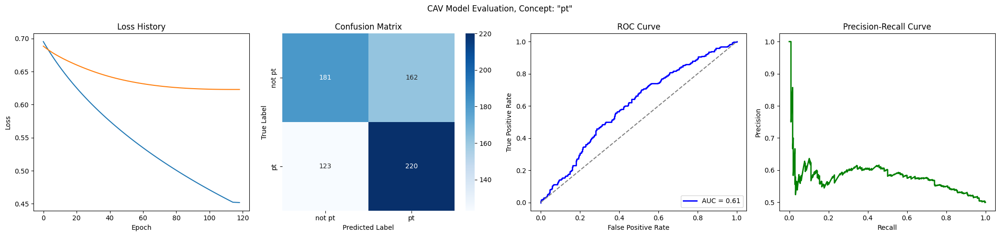

Training run 88/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6558
Epoch 11 Validation Loss: 0.6797
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6228
Epoch 21 Validation Loss: 0.6702
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5941
Epoch 31 Validation Loss: 0.6632
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5690
Epoch 41 Validation Loss: 0.6582
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5467
Epoch 51 Validation Loss: 0.6547
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5265
Epoch 61 Validation Loss: 0.6522
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5082
Epoch 71 Validation Loss: 0.6504
Model saved to trai

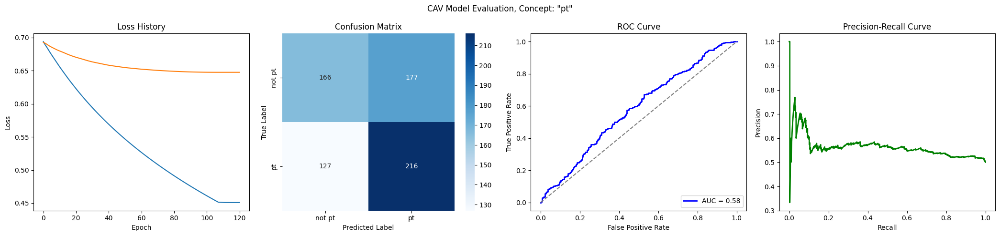

Training run 89/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6665
Epoch 11 Validation Loss: 0.6825
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6394
Epoch 21 Validation Loss: 0.6738
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6144
Epoch 31 Validation Loss: 0.6652
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5919
Epoch 41 Validation Loss: 0.6576
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5715
Epoch 51 Validation Loss: 0.6514
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5528
Epoch 61 Validation Loss: 0.6466
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5354
Epoch 71 Validation Loss: 0.6429
Model saved to trai

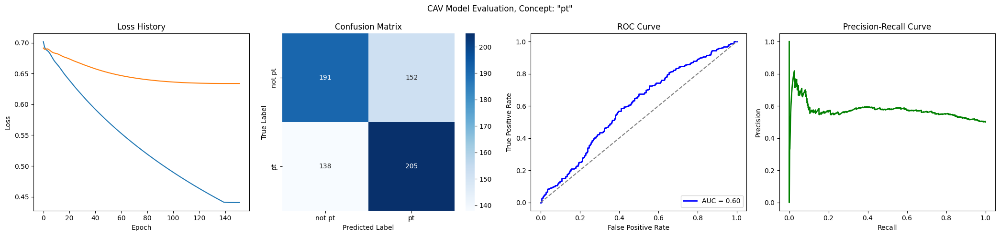

Training run 90/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6978
Epoch 1 Validation Loss: 0.6960
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6561
Epoch 11 Validation Loss: 0.6787
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6214
Epoch 21 Validation Loss: 0.6672
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5923
Epoch 31 Validation Loss: 0.6597
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5670
Epoch 41 Validation Loss: 0.6545
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5448
Epoch 51 Validation Loss: 0.6510
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5248
Epoch 61 Validation Loss: 0.6487
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5067
Epoch 71 Validation Loss: 0.6475
Model saved to trai

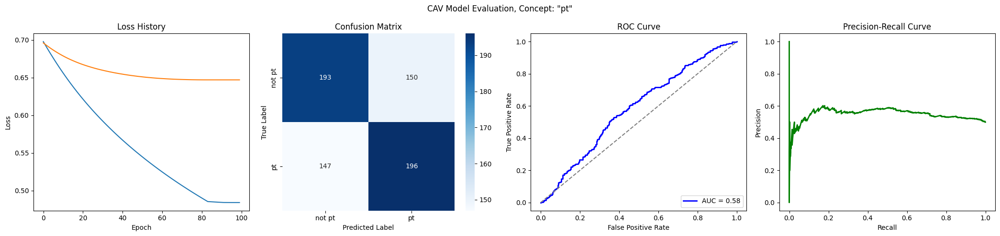

Training run 91/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6946
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6511
Epoch 11 Validation Loss: 0.6848
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6159
Epoch 21 Validation Loss: 0.6783
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5854
Epoch 31 Validation Loss: 0.6734
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5589
Epoch 41 Validation Loss: 0.6705
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5355
Epoch 51 Validation Loss: 0.6695
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 59
Loss history saved to trainings/language_pt/loss_history.json


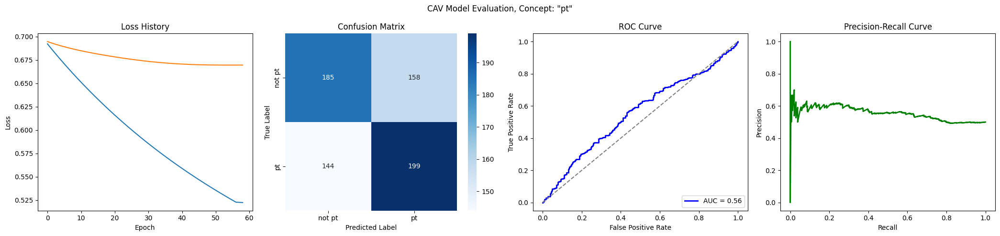

Training run 92/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6895
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6452
Epoch 11 Validation Loss: 0.6827
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6085
Epoch 21 Validation Loss: 0.6773
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5780
Epoch 31 Validation Loss: 0.6743
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5520
Epoch 41 Validation Loss: 0.6723
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5293
Epoch 51 Validation Loss: 0.6709
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5091
Epoch 61 Validation Loss: 0.6699
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4909
Epoch 71 Validation Loss: 0.6696
Model saved to trai

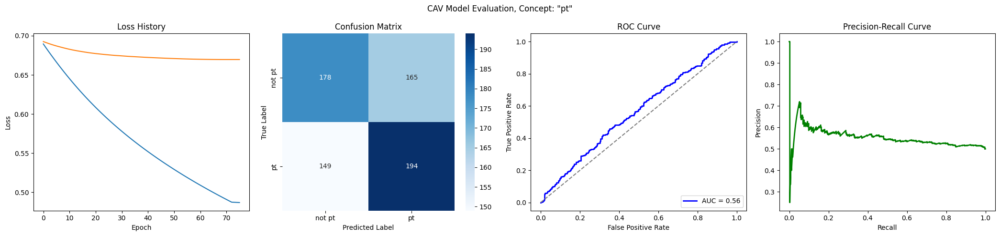

Training run 93/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6919
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6582
Epoch 11 Validation Loss: 0.6777
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6263
Epoch 21 Validation Loss: 0.6663
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5984
Epoch 31 Validation Loss: 0.6577
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5735
Epoch 41 Validation Loss: 0.6506
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5513
Epoch 51 Validation Loss: 0.6453
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5313
Epoch 61 Validation Loss: 0.6414
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5131
Epoch 71 Validation Loss: 0.6385
Model saved to trai

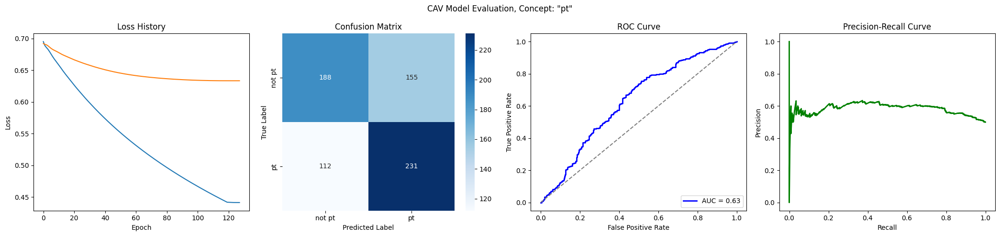

Training run 94/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6912
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6531
Epoch 11 Validation Loss: 0.6844
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6213
Epoch 21 Validation Loss: 0.6794
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5941
Epoch 31 Validation Loss: 0.6725
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5701
Epoch 41 Validation Loss: 0.6662
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5486
Epoch 51 Validation Loss: 0.6627
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5293
Epoch 61 Validation Loss: 0.6614
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5116
Epoch 71 Validation Loss: 0.6609
Model saved to trai

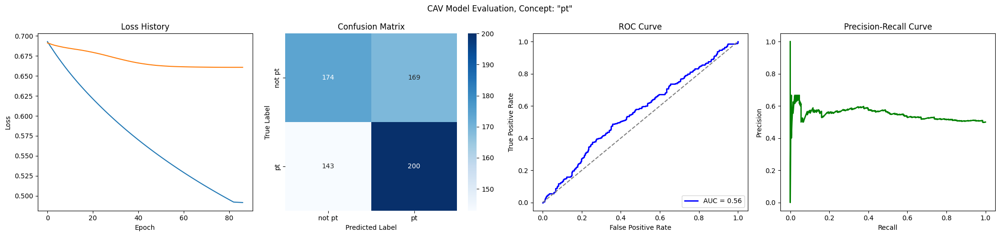

Training run 95/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6932
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6583
Epoch 11 Validation Loss: 0.6731
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6279
Epoch 21 Validation Loss: 0.6613
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6011
Epoch 31 Validation Loss: 0.6526
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5773
Epoch 41 Validation Loss: 0.6465
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5560
Epoch 51 Validation Loss: 0.6424
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5367
Epoch 61 Validation Loss: 0.6397
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5190
Epoch 71 Validation Loss: 0.6381
Model saved to trai

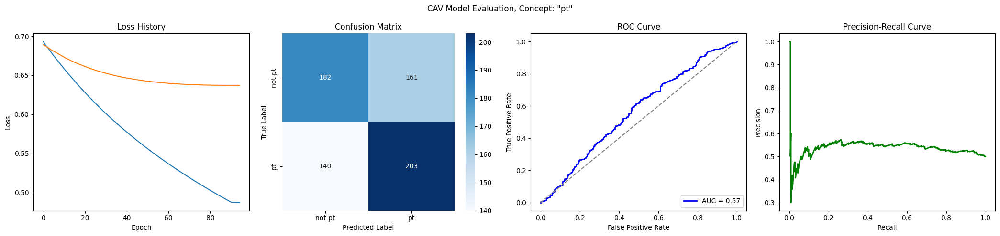

Training run 96/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6521
Epoch 11 Validation Loss: 0.6775
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6184
Epoch 21 Validation Loss: 0.6705
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5903
Epoch 31 Validation Loss: 0.6667
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5664
Epoch 41 Validation Loss: 0.6641
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5455
Epoch 51 Validation Loss: 0.6615
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5267
Epoch 61 Validation Loss: 0.6589
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5095
Epoch 71 Validation Loss: 0.6565
Model saved to trai

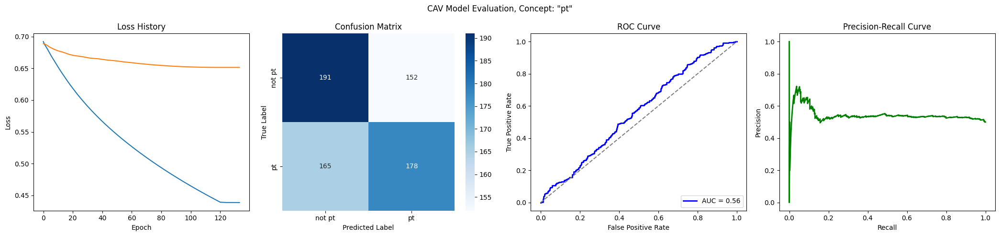

Training run 97/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7006
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6625
Epoch 11 Validation Loss: 0.6827
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6330
Epoch 21 Validation Loss: 0.6743
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.6076
Epoch 31 Validation Loss: 0.6668
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5855
Epoch 41 Validation Loss: 0.6598
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5659
Epoch 51 Validation Loss: 0.6537
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5480
Epoch 61 Validation Loss: 0.6490
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.5317
Epoch 71 Validation Loss: 0.6454
Model saved to trai

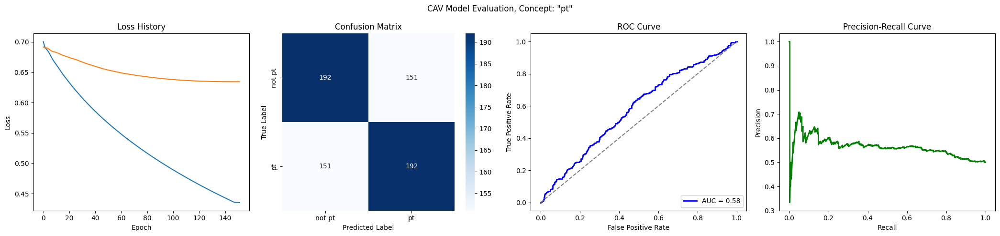

Training run 98/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6941
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6512
Epoch 11 Validation Loss: 0.6843
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6141
Epoch 21 Validation Loss: 0.6817
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5821
Epoch 31 Validation Loss: 0.6806
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 37
Loss history saved to trainings/language_pt/loss_history.json


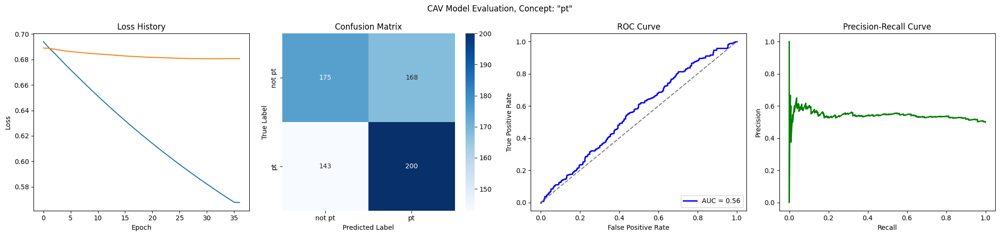

Training run 99/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6942
Epoch 1 Validation Loss: 0.6921
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6534
Epoch 11 Validation Loss: 0.6774
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6180
Epoch 21 Validation Loss: 0.6657
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5874
Epoch 31 Validation Loss: 0.6567
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5608
Epoch 41 Validation Loss: 0.6502
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5372
Epoch 51 Validation Loss: 0.6455
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5161
Epoch 61 Validation Loss: 0.6422
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4971
Epoch 71 Validation Loss: 0.6398
Model saved to trai

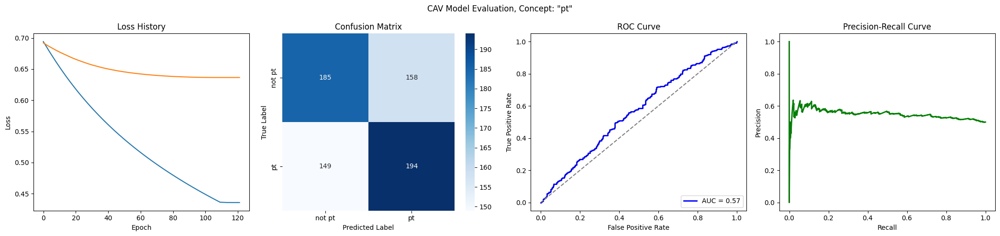

Training run 100/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6978
Epoch 1 Validation Loss: 0.6927
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6574
Epoch 11 Validation Loss: 0.6806
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6231
Epoch 21 Validation Loss: 0.6725
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5931
Epoch 31 Validation Loss: 0.6674
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5669
Epoch 41 Validation Loss: 0.6644
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5438
Epoch 51 Validation Loss: 0.6633
Model saved to trainings/language_pt/state_dict.pth
Early stopping at epoch 60
Loss history saved to trainings/language_pt/loss_history.json


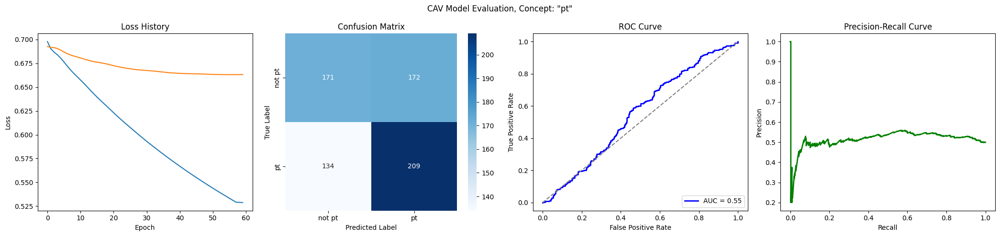

CPU times: user 14min 22s, sys: 10min 46s, total: 25min 8s
Wall time: 2h 20min


In [ ]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [ ]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [ ]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [ ]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [ ]:
validation_sample_count

41

In [ ]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


361 41
Epoch 1/500
Epoch 1 Train Loss: 0.6973
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/language_pt/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6337
Epoch 11 Validation Loss: 0.6713
Model saved to trainings/language_pt/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5927
Epoch 21 Validation Loss: 0.6450
Model saved to trainings/language_pt/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5627
Epoch 31 Validation Loss: 0.6270
Model saved to trainings/language_pt/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5390
Epoch 41 Validation Loss: 0.6136
Model saved to trainings/language_pt/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5194
Epoch 51 Validation Loss: 0.6029
Model saved to trainings/language_pt/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.5026
Epoch 61 Validation Loss: 0.5941
Model saved to trainings/language_pt/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4880
Epoch 71 Validation Loss: 0.5868
Model saved to trainings/language_pt/sta

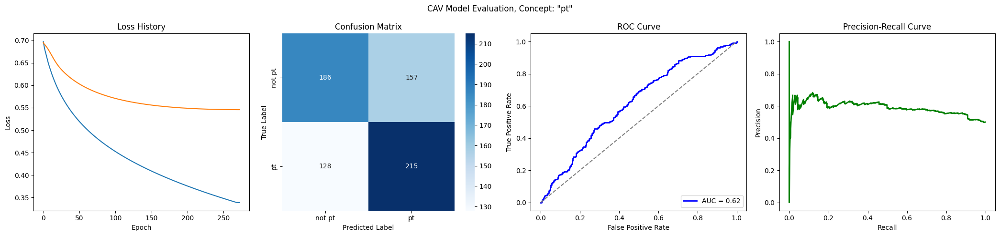

In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
